# Загрузка датасета прямиком с kaggle

In [1]:
# !pip install -q kaggle

You should consider upgrading via the '/Users/katyona/Desktop/University/proga/iad/notebooks/bin/python3 -m pip install --upgrade pip' command.


In [384]:
# !pip install folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.3/102.3 KB 1.8 MB/s eta 0:00:00a 0:00:01
You should consider upgrading via the '/Users/katyona/Desktop/University/proga/iad/notebooks/bin/python3 -m pip install --upgrade pip' command.


In [387]:
# !pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 17.1 MB/s eta 0:00:0000:0100:01
You should consider upgrading via the '/Users/katyona/Desktop/University/proga/iad/notebooks/bin/python3 -m pip install --upgrade pip' command.


In [3]:
# ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json

In [4]:
# ! kaggle datasets download -d jessemostipak/hotel-booking-demand

 80%|██████████████████████████████▍       | 1.00M/1.25M [00:00<00:00, 2.61MB/s]
100%|██████████████████████████████████████| 1.25M/1.25M [00:00<00:00, 2.83MB/s]


In [5]:
# !unzip hotel-booking-demand.zip

Archive:  hotel-booking-demand.zip
replace hotel_bookings.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


# EDA

## Подготовка данных к анализу

In [292]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import pickle

import folium
from folium.plugins import HeatMap
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

%config InlineBackend.figure_format = 'retina'
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['font.size'] = 12
sns.set(style="darkgrid")
plt.rcParams['axes.prop_cycle'] = plt.style.library['bmh']['axes.prop_cycle']

In [2]:
data = pd.read_csv('hotel_bookings.csv')

In [3]:
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [5]:
data.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


В данных присутствуют пропущенные значения

In [6]:
data.isnull().any().any()

True

In [7]:
null = pd.DataFrame({
    'Null Values' : data.isnull().sum(), 
    'Percentage Null Values' : (data.isna().sum()) / (data.shape[0]) * (100)
})
null

,Null Values,Percentage Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


### Вывод

Пропущенные значения присутствуют лишь в четырех столбцах, и все из них - категориальные (кроме `children` - его просто заменим нулями). Значит, убрать пропущенные значения будет возможно на этапе подготовки данных. В зависимости от того, насколько сильно целевая переменная будет зависеть от значения этих столбцов, будет использован либо one-hot encoding, либо столбец просто не будет использоваться.Если окажется, что целевая переменная значительно зависит от значений этих столбцов, для них будет применен one-hot encoding, а в противном случае столбцы будут удалены из рассмотрения.

In [378]:
data['children'] = data['children'].fillna(0)

## Добавление новых признаков

In [296]:
def additional_features(dataset):
    data = dataset.copy()
    
    # изменение типа данных в дату
    data['reservation_status_date'] = pd.to_datetime(data['reservation_status_date'])
    
    # добавления столбца "дата заезда", собирающего вместе год, месяц и день
    data['arrival_date'] = pd.to_datetime(
        data['arrival_date_year'].astype(str)  + \
        data['arrival_date_month'] + \
        data['arrival_date_day_of_month'].astype(str), 
        format='%Y%B%d'
    )
    
    # добавление столбца даты бронирования
    data['booking_date'] = data['arrival_date'] -  pd.to_timedelta(data['lead_time'], unit='d')
    
    # добавление столбца общего числа ночей
    data['stays_in_total_nights'] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
    
    # добавление столбца даты выезда
    data['chekcout_date'] = data['arrival_date'] + pd.to_timedelta(data['stays_in_total_nights'], unit='day')
    
    # добавление столбца общего количества людей
    data['people_total'] = data['adults'] + data['children'] + data['babies']
    
    return data

Столбец `reservation_status_date` представляет из себя дату последнего изменения статуса гостя. Его необходимо перевести в формат даты

In [8]:
data['reservation_status_date'] = pd.to_datetime(data['reservation_status_date'])

В изначальной таблице дата заезда разбита на год месяц и день, но присутствует дата последней смены статуса гостя. Чтобы проверить, совпадают ли эти даты, необходимо создать столбец даты заезда

In [9]:
data['arrival_date'] = pd.to_datetime(
    data['arrival_date_year'].astype(str)  + \
    data['arrival_date_month'] + \
    data['arrival_date_day_of_month'].astype(str), 
    format='%Y%B%d'
)

Дату бронирования можно получить посредством вычитания из даты заезда значения `lead_time` - количество времени, прошедшего с момента бронирования до момента (предполагаемого) заезда

In [401]:
data['booking_date'] = data['arrival_date'] -  pd.to_timedelta(data['lead_time'], unit='d')

Для получения информации о том, сколько ночей гости в среднем проводят в отелях, необходимо сложить количество ночей в будние и выходные дни

In [11]:
data['stays_in_total_nights'] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']

Также в таблице отсутствует информация об общем количестве гостей, заездающих в рамках одного бронирования. Для того, чтобы получить это значение, необходимо сложить значения столбцов `adults`, `children` и `babies`

In [379]:
data['people_total'] = data['adults'] + data['children'] + data['babies']

Чтобы знать, когда постояльцы планируют выехать из отеля, стоит рассчитать дату выезда. Для этого необходимо к дате заезда прибавить общее количество ночей

In [13]:
data['chekcout_date'] = data['arrival_date'] + pd.to_timedelta(data['stays_in_total_nights'], unit='day')

### Вывод:

Для удобства дальнейшей работы были добавлены столбцы `arrival_date`, `booking_date`, `stays_in_total_nights`, `people_total` и `checkout_date`.

## Проверки на несоответствия: предварительная чистка

In [294]:
def data_cleaning(dataset):
    data = dataset.copy()
    
    # общее количество ночей равно 0
    drop0 = data[data['stays_in_total_nights'] == 0]
    data = data.drop(drop0.index.to_list())
    
    # общее кол-во людей равно 0
    drop0people = data[data['people_total'] == 0]
    data = data.drop(drop0people.index.to_list())
    
    # записи, когда люди выехали в один день с заездом
    early_leave = data[(data['arrival_date'] == data['reservation_status_date']) & (data['is_canceled'] == 0)]
    data = data.drop(early_leave.index.to_list())
    
    return data

Отсутствуют несоответствия по количеству забронированных ночей (когда количество ночей на выходных превышает количество ночей в будние дни при том, что количество ночей в будние дни больше двух - если все забронированные промежутки времени непрерывны, то такая ситуация невозможна)

In [14]:
data[(data['stays_in_week_nights'] <= data['stays_in_weekend_nights']) & (data['stays_in_week_nights'] > 2)]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,booking_date,stays_in_total_nights,people_total,chekcout_date


Также в данных присутствуют записи, когда гости не отменяли свое бронирование, но суммарное число ночей, на которое они бронировали номер, составляет 0. Их немного и стоит их удалить, так как при предсказании спроса нас интересуют гости, которые остаются в отеле и пользуются его услугами, то есть снимают номер хотя бы на одну ночь.

In [15]:
data[data['stays_in_total_nights'] == 0].shape[0]

715

In [16]:
drop0 = data[data['stays_in_total_nights'] == 0]
data = data.drop(drop0.index.to_list())

В данных присутствуют значения, когда количество заехавших людей равно 0 (суммарное количество взрослых, детей и младенцев)). Их необходимо удалить

In [17]:
drop0 = data[data['people_total'] == 0]
drop0

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,booking_date,stays_in_total_nights,people_total,chekcout_date
2224,Resort Hotel,0,1,2015,October,41,6,0,3,0,...,0.00,0,0,Check-Out,2015-10-06,2015-10-06,2015-10-05,3,0.0,2015-10-09
3181,Resort Hotel,0,36,2015,November,47,20,1,2,0,...,0.00,0,0,Check-Out,2015-11-23,2015-11-20,2015-10-15,3,0.0,2015-11-23
3684,Resort Hotel,0,165,2015,December,53,30,1,4,0,...,0.00,0,0,Check-Out,2016-01-04,2015-12-30,2015-07-18,5,0.0,2016-01-04
3708,Resort Hotel,0,165,2015,December,53,30,2,4,0,...,0.00,0,0,Check-Out,2016-01-05,2015-12-30,2015-07-18,6,0.0,2016-01-05
31765,Resort Hotel,0,31,2016,December,53,27,2,8,0,...,28.00,1,0,Check-Out,2017-01-06,2016-12-27,2016-11-26,10,0.0,2017-01-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115029,City Hotel,0,107,2017,June,26,27,0,3,0,...,100.80,0,0,Check-Out,2017-06-30,2017-06-27,2017-03-12,3,0.0,2017-06-30
115091,City Hotel,0,1,2017,June,26,30,0,1,0,...,0.00,1,1,Check-Out,2017-07-01,2017-06-30,2017-06-29,1,0.0,2017-07-01
116251,City Hotel,0,44,2017,July,28,15,1,1,0,...,73.80,0,0,Check-Out,2017-07-17,2017-07-15,2017-06-01,2,0.0,2017-07-17
116534,City Hotel,0,2,2017,July,28,15,2,5,0,...,22.86,0,1,Check-Out,2017-07-22,2017-07-15,2017-07-13,7,0.0,2017-07-22


In [18]:
data = data.drop(drop0.index.to_list())

В большинстве случаев дата изменения статуса не совпадает с датой заезда, что логично, так как в большей части записей статус последний раз менялся при выезде гостя или при отмене бронирования

In [19]:
# доля гостей, дата заезда которых не совпадает с датой последнего изменения статуса
(data[data['arrival_date'] != data['reservation_status_date']]).shape[0] / data.shape[0]

0.9825243537300216

Видно, что гости, у которых дата заезда не совпадает с датой последнего изменения статуса, либо выехали, либо отменили бронь. Нашлась лишь одна запись, при которой даты заезда и изменения статуса не совпадают, и статус гостя при этом `No-Show` - то есть он забронировал, но не явился

In [20]:
# доля гостей, которые отменили бронь, из тех, у кого дата изменения статуса не совпадает с заездом
filter_res_no_arr = (data['arrival_date'] != data['reservation_status_date'])
filter_stat_canc = (data['reservation_status'] == 'Canceled')
(data[filter_res_no_arr & filter_stat_canc]).shape[0] / data[filter_res_no_arr].shape[0]

0.3616354630750345

In [21]:
# доля гостей, которые выехали, из тех, у кого дата изменения статуса не совпадает с заездом
filter_res_no_arr = (data['arrival_date'] != data['reservation_status_date'])
filter_stat_chout = (data['reservation_status'] == 'Check-Out')
(data[filter_res_no_arr & filter_stat_chout]).shape[0] / data[filter_res_no_arr].shape[0]

0.6383559527181891

При этом среди тех записей, в которых дата заезда совпадает с датой изменения статуса, не пришедших, но не отменивших бронь, меньше 45%, а тех, кто отменил бронь в день заезда, чуть более 31%

In [22]:
filter_res_arr = (data['arrival_date'] == data['reservation_status_date'])
filter_stat_noshow = (data['reservation_status'] == 'No-Show')
(data[filter_res_arr & filter_stat_noshow]).shape[0] / data[filter_res_arr].shape[0]

0.5752895752895753

In [23]:
(data[filter_res_arr & filter_stat_canc]).shape[0] / data[filter_res_arr].shape[0]

0.4126447876447876

Также отсутствуют строки, в которых есть несоответствие по полям `is_canceled` и `reservation_status`. Это значит, что не бывает ситуаций, когда бронь считается отмененной, но при этом имеет статус "Check-Out", или когда бронь не является отмененной, но имеет статус "Canceled" или "No-Show"

In [24]:
data[(data['is_canceled'] == 0) & (filter_stat_canc | filter_stat_noshow)]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,booking_date,stays_in_total_nights,people_total,chekcout_date


In [25]:
data[(data['is_canceled'] == 1) & (filter_stat_chout)]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date,booking_date,stays_in_total_nights,people_total,chekcout_date


Существует вероятность, что некоторые гости бронируют одно число ночей, а остаются в итоге на другое. Предполагается, что если гость решит остаться на более долгий срок, чем изначально планировалось, и у отеля будет возможность предоставить такие услуги, данные о бронировании изменятся, и отследить это в имеющейся таблице будет невозможно. Но если гость решит выехать раньше, чем планировал, дата последнего изменения статуса будет отличаться от рассчитанной ранее предполагаемой даты выезда. Логично рассматривать только не отмененные бронирования.

В результате нашлись 26 строк, удовлетворяющих этому условию. Удалять их нет необходимости, но было необходимо проверить их наличие, чтобы понимать, по каким данным стоит рассчитывать `occupancy rate`

In [26]:
data[(data['chekcout_date'] > data['reservation_status_date']) & (data['is_canceled'] == 0)].shape

(26, 37)

При этом нашлись 25 человек, которые выехали в тот же день, что и заехали. Таким образом, можно сказать, что ресурсы отеля они не задействовали, а значит, их можно не учитывать и удалить

In [27]:
early_leave = data[(data['arrival_date'] == data['reservation_status_date']) & (data['is_canceled'] == 0)]
early_leave.shape

(25, 37)

In [28]:
data = data.drop(early_leave.index.to_list())

In [339]:
data.shape

(118540, 37)

In [347]:
data[data['is_canceled'] == 0].shape[0] / data[data['is_canceled'] == 1].shape[0]

1.6833574791742123

### Вывод:

В данных обнаружены лишь 2 несоответствия:
1. Бывают бронирования на нулевое количество гостей - строки с этими данными удалены и рассматриваться далее не будут.
2. Обнаружена одна запись со статусом `No-Show` и несовпадающими датами заезда и изменения статуса. Можно предположить, что эта запись является ошибкой системы или администратора. 

## Подсчет occupancy rate

После того, как данные предварительно очищены и избавлены от несоответствий, можно подсчитать `occupancy rate`. Под ним подразумевается количество людей, одновременно пребывающих в отеле в определенный период времени. В данном случае будет расчитываться `occupancy rate` по дням. 

`occupancy rate` на выбранный день будет состоять из суммы гостей в записях, удовлетворяющих следующим условиям:
1. Бронирование не было отменено
2. Дата заезда совпадает с выбранным днем или заезд произошел раньше
3. Дата последнего изменения статуса совпадает с выбранным днем или будет позже

Поскольку отели разных типов и спрос на них в разное время разный, их загруженность стоит считать отдельно.

In [332]:
def get_occupancy_rate(data, filters=(data['is_canceled'] == 0)):
    
    arrivals = pd.DataFrame(data[filters].groupby('arrival_date')['people_total'].sum())
    arrivals = arrivals.rename(columns={'people_total': 'people_arrived'})
    
    checkouts = pd.DataFrame(data[filters].groupby('reservation_status_date')['people_total'].sum())
    checkouts = checkouts.rename(columns={
        'reservation_status_date': 'checkout_date',
        'people_total': 'people_left'
                                     })
    
    # найдем мин и макс дату
    min_date = min(arrivals.index.min(), checkouts.index.min())
    max_date = max(arrivals.index.max(), checkouts.index.max())
    # по ним сделаем список дней, чтобы точно не пропустить ни один день
    dates_range = np.arange(min_date, max_date,  np.timedelta64(1, "D"))
    dates_range = pd.Series(index=dates_range, dtype='float64')

    # склеим все три таблицы внешним соединением и удалим лишний столбец
    ins_outs = pd.concat(
        objs = [arrivals, checkouts, dates_range],
        axis = 1,
        join = 'outer'
    )
    ins_outs.drop(columns=0, inplace=True)
    
    # заполним пропуски
    ins_outs = ins_outs.fillna(0)
    # посчитаем оставшиеся данные
    ins_outs['ever_arrived'] = np.cumsum(ins_outs['people_arrived'])
    ins_outs['ever_left'] = np.cumsum(ins_outs['people_left'])
    ins_outs['occupancy_rate'] = ins_outs['ever_arrived'] - ins_outs['ever_left']
    
    return ins_outs

In [333]:
city_or = get_occupancy_rate(data, filters=((data['is_canceled'] == 0) & (data['hotel'] == 'City Hotel')))
resort_or = get_occupancy_rate(data, filters=((data['is_canceled'] == 0) & (data['hotel'] == 'Resort Hotel')))

In [334]:
city_or

,people_arrived,people_left,ever_arrived,ever_left,occupancy_rate
2015-07-01,116.0,0.0,116.0,0.0,116.0
2015-07-02,1.0,0.0,117.0,0.0,117.0
2015-07-03,18.0,111.0,135.0,111.0,24.0
2015-07-04,16.0,0.0,151.0,111.0,40.0
2015-07-05,0.0,17.0,151.0,128.0,23.0
...,...,...,...,...,...
2017-09-03,0.0,102.0,89000.0,88933.0,67.0
2017-09-04,0.0,47.0,89000.0,88980.0,20.0
2017-09-05,0.0,5.0,89000.0,88985.0,15.0
2017-09-06,0.0,6.0,89000.0,88991.0,9.0


In [335]:
resort_or

,people_arrived,people_left,ever_arrived,ever_left,occupancy_rate
2015-07-01,66.0,0.0,66.0,0.0,66.0
2015-07-02,72.0,9.0,138.0,9.0,129.0
2015-07-03,59.0,22.0,197.0,31.0,166.0
2015-07-04,80.0,18.0,277.0,49.0,228.0
2015-07-05,80.0,54.0,357.0,103.0,254.0
...,...,...,...,...,...
2017-09-10,0.0,9.0,55827.0,55821.0,6.0
2017-09-11,0.0,0.0,55827.0,55821.0,6.0
2017-09-12,0.0,2.0,55827.0,55823.0,4.0
2017-09-13,0.0,0.0,55827.0,55823.0,4.0


In [336]:
# city_or = city_or['occupancy_rate']
# resort_or = resort_or['occupancy_rate']
occupancy_rate = get_occupancy_rate(data)

In [337]:
city_or.to_csv('city_or.csv')
resort_or.to_csv('resort_or.csv')
occupancy_rate.to_csv('occupancy_rate.csv')

## Анализ данных

Первым делом рассмотрим распределение показателей по времени: бронирований, а затем заездов

Самое первое бронирование, имеющееся в датасете, состоялось за 709 дней до заезда

In [34]:
filter0 = (data['is_canceled'] == 0)

In [35]:
data[filter0]['booking_date'].nunique()

967

In [393]:
filter0 = (data['booking_date'] >= pd.to_datetime('2014-10-01'))
filter1 = (data['arrival_date'] >= pd.to_datetime('2014-10-01')) & (data['is_canceled'] == 0)

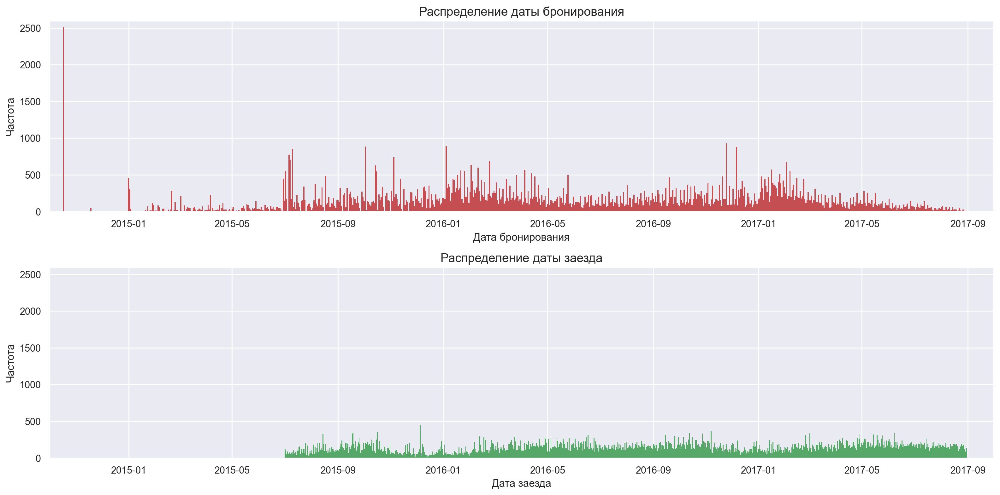

In [36]:
fig, axs = plt.subplots(2, 1, figsize=(16, 8))

axs[0].hist(x=data['booking_date'], bins=int(data[filter0]['booking_date'].nunique()), color='r', lw=0)
axs[0].set_xlabel('Дата бронирования', fontsize=12)
axs[0].set_ylabel("Частота", fontsize=12)
axs[0].set_title('Распределение даты бронирования', fontsize=14)
axs[0].set_xlim(pd.to_datetime('2014-10-01'), pd.to_datetime('2017-10-01'))
axs[0].set_ylim(0, 2600)

axs[1].hist(x=data['arrival_date'], bins=int(data[filter1]['arrival_date'].nunique()), color='g', lw=0)
axs[1].set_xlabel('Дата заезда', fontsize=12)
axs[1].set_ylabel("Частота", fontsize=12)
axs[1].set_title('Распределение даты заезда', fontsize=14)
axs[1].set_xlim(pd.to_datetime('2014-10-01'), pd.to_datetime('2017-10-01'))
axs[1].set_ylim(0, 2600)

plt.tight_layout()
plt.show()

По графикам выше видно, что бронирования совершаются чаще, чем заезды, что логично, так как на графике рассматривались заезды, относящиеся лишь к не отмененным бронированиям. Также на графике видно, что периодичность, с которой совершаются бронирования составляет меньший период, чем периодичность, с которой совершаются заезды. Сезонность заездов составляет около года (с пиком в августе и наименьшим значением в январе), но у бронирований долгосрочная сезонность выражена не так сильно, как краткосрочная. Есть смысл проверить данные на сезонность.

In [37]:
def demonstrate_seasonality(df, win_len, title="", legend=False):
    index = 0
    max_index = df.shape[0] - 1
    array = df.values
    
    plt.figure(figsize=(13, 5))
    while True:
        if index + win_len > max_index:
            array = array[index:]
            plt.plot(np.arange(array.shape[0]), array, label=f'num {index // win_len + 1}')
            break
        plt.plot(np.arange(win_len), array[index:index + win_len], label=f'num {index // win_len + 1}')
        index += win_len
    if legend:
        plt.legend()
    plt.title(title)
    plt.show()

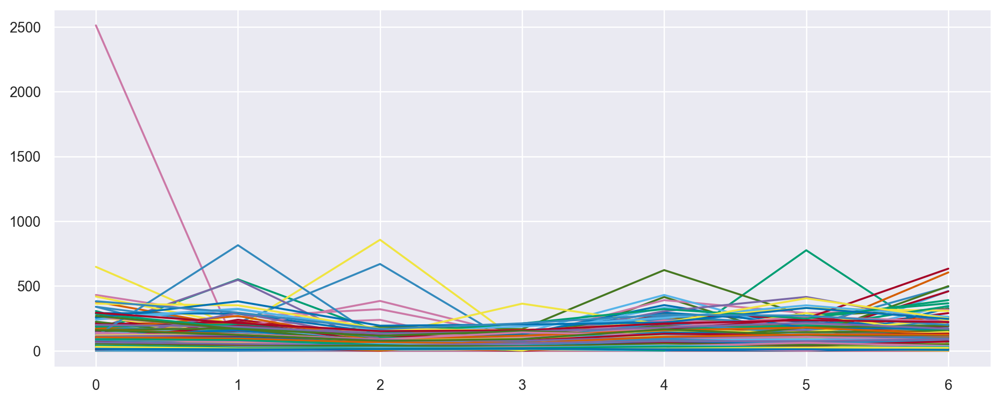

In [38]:
gb_booking_date = pd.DataFrame(data.groupby('booking_date')['booking_date'].count())
demonstrate_seasonality(gb_booking_date, 7)

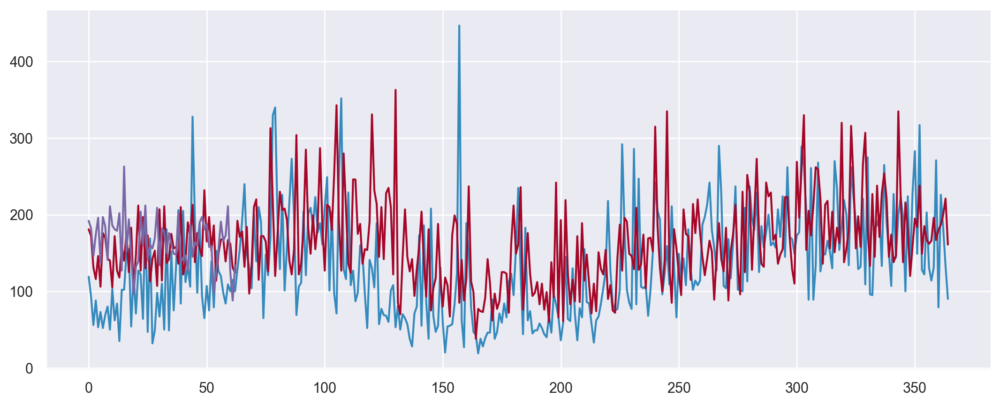

In [39]:
gb_arr_date = pd.DataFrame(data.groupby('arrival_date')['arrival_date'].count())
demonstrate_seasonality(gb_arr_date, 365)

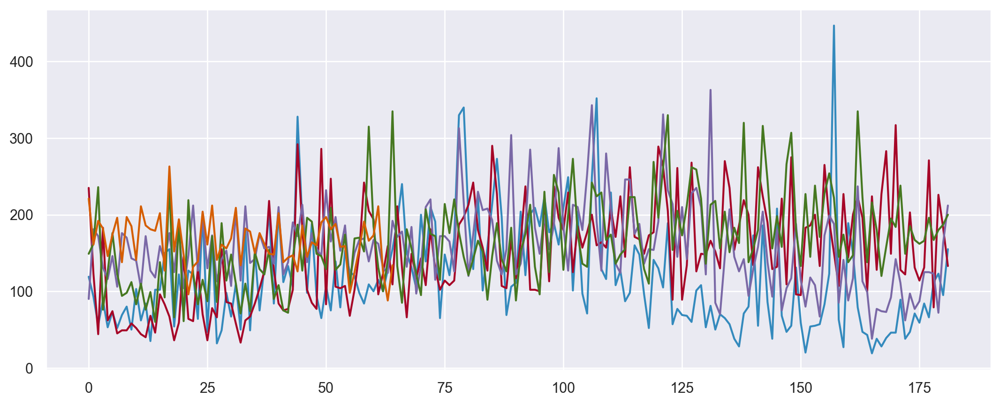

In [40]:
gb_arr_date = pd.DataFrame(data.groupby('arrival_date')['arrival_date'].count())
demonstrate_seasonality(gb_arr_date, 182)

In [41]:
gb_arr_month = gb_arr_date.rename(columns={"arrival_date": 'count'}).reset_index()
gb_arr_month['arrival_month'] = pd.to_datetime(gb_arr_month['arrival_date'].astype(str).apply(lambda x: x[:7]))
gb_arr_month = gb_arr_month.groupby('arrival_month')['count'].sum()

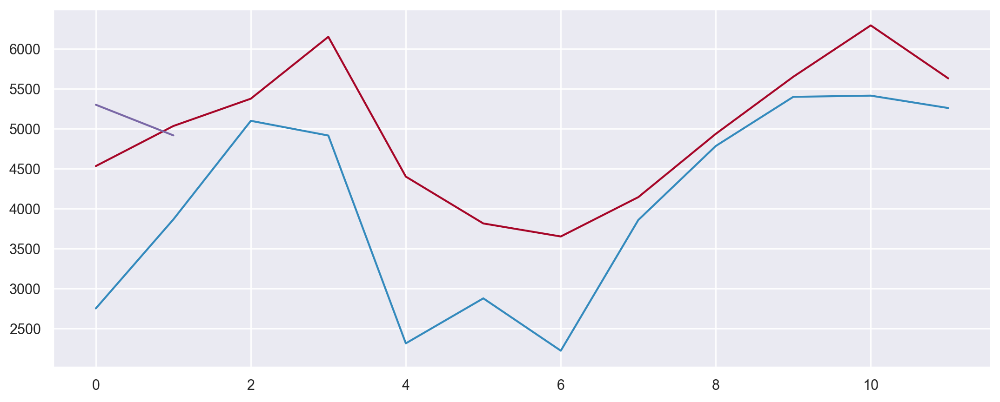

In [42]:
demonstrate_seasonality(gb_arr_month, 12)

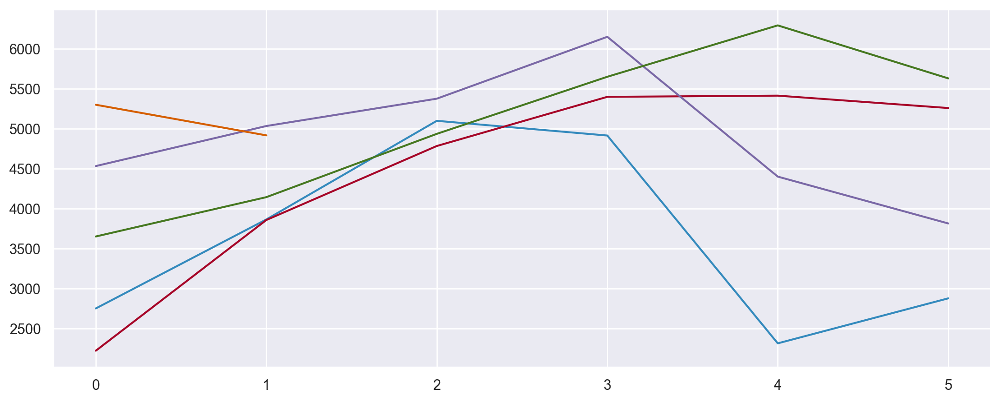

In [43]:
demonstrate_seasonality(gb_arr_month, 6)

При этом выше были рассмотрены именно количества бронирований и заездов, но нельзя сделать выводов о том, какое количество людей остается в отеле. Чтобы решить эту задачу, необходимо посчитать сумму людей для каждого периода

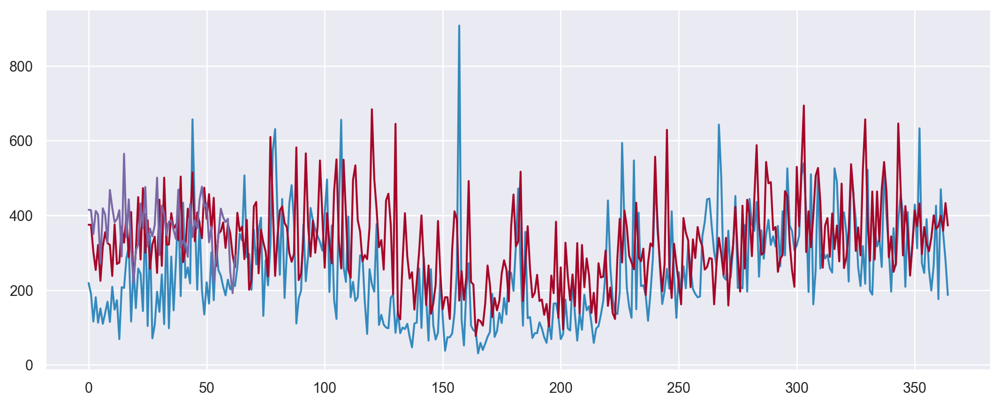

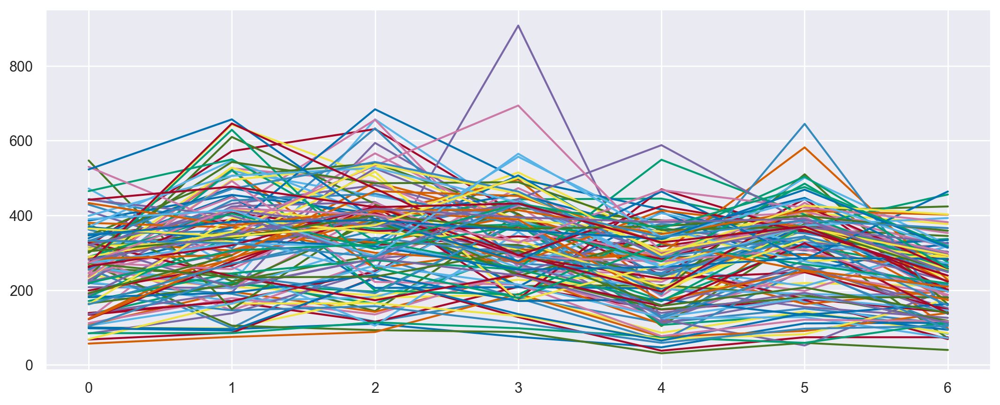

In [44]:
gb_arr_people = pd.DataFrame(data.groupby('arrival_date')['people_total'].sum())
demonstrate_seasonality(gb_arr_people, 365)
demonstrate_seasonality(gb_arr_people, 7)

Теперь посмотрим на то, как в течение времени ведет себя `occupancy_rate`

Очень четко прослеживается сезонность в течение года. Видно, что наибольшие значения достигаются в августе, а самые низкие значения - в январе. При этом в самом начале января на фоне низкой загруженности выделяется пик - есть предположение, что он связан с новогодними/рождественскими праздниками

In [45]:
occupancy_rate

,people_arrived,people_left,ever_arrived,ever_left,occupancy_rate
2015-07-01,182.0,0.0,182.0,0.0,182.0
2015-07-02,73.0,9.0,255.0,9.0,246.0
2015-07-03,77.0,133.0,332.0,142.0,190.0
2015-07-04,96.0,18.0,428.0,160.0,268.0
2015-07-05,80.0,71.0,508.0,231.0,277.0
...,...,...,...,...,...
2017-09-08,0.0,8.0,144827.0,144799.0,28.0
2017-09-09,0.0,13.0,144827.0,144812.0,15.0
2017-09-10,0.0,9.0,144827.0,144821.0,6.0
2017-09-12,0.0,2.0,144827.0,144823.0,4.0


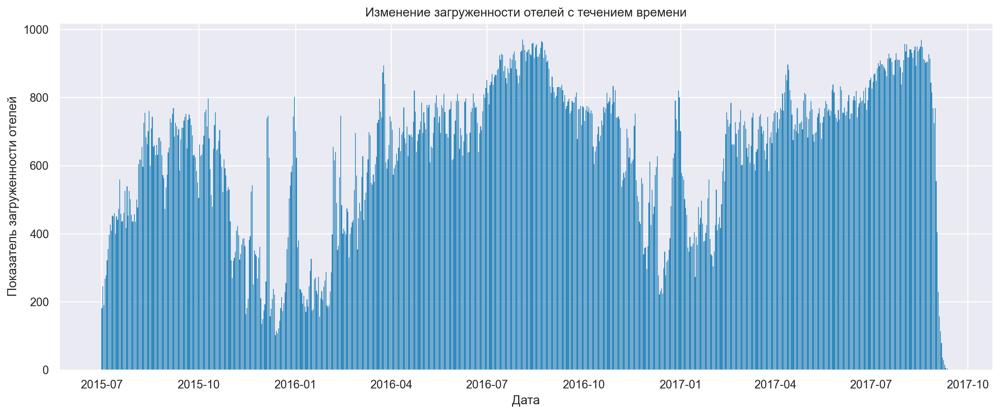

In [46]:
plt.figure(figsize=(16, 6))

plt.bar(occupancy_rate.index.to_list(), height=occupancy_rate['occupancy_rate'].values, lw=0.)

plt.xlabel('Дата')
plt.ylabel('Показатель загруженности отелей')
plt.title('Изменение загруженности отелей с течением времени')
plt.show()

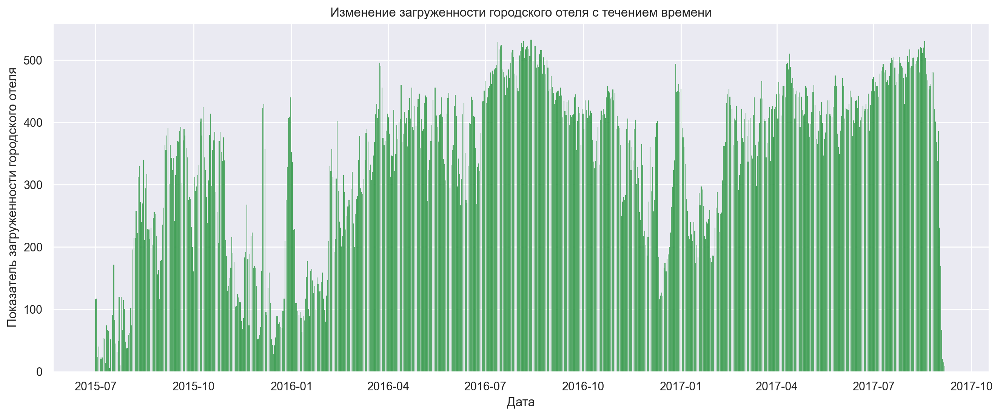

In [47]:
plt.figure(figsize=(16, 6))

plt.bar(city_or.index.to_list(), height=city_or.values, color='g', lw=0.)

plt.xlabel('Дата')
plt.ylabel('Показатель загруженности городского отеля')
plt.title('Изменение загруженности городского отеля с течением времени')
plt.show()

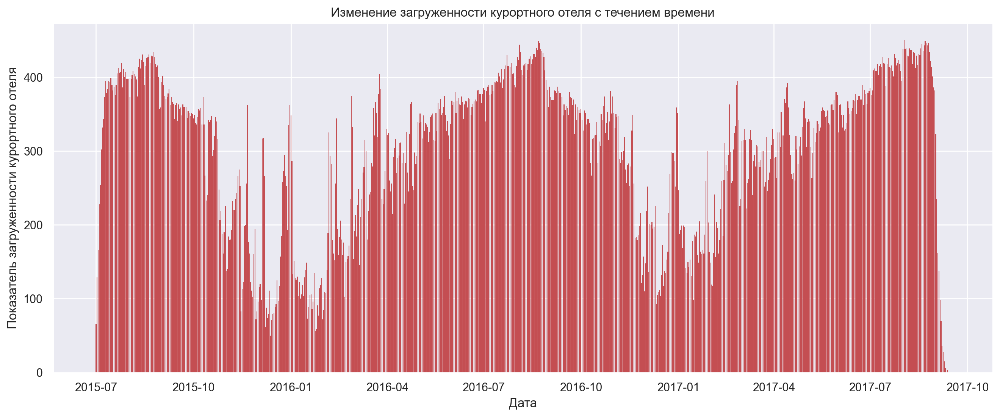

In [48]:
plt.figure(figsize=(16, 6))

plt.bar(resort_or.index.to_list(), height=resort_or.values, color='r', lw=0.)

plt.xlabel('Дата')
plt.ylabel('Показатель загруженности курортного отеля')
plt.title('Изменение загруженности курортного отеля с течением времени')
plt.show()

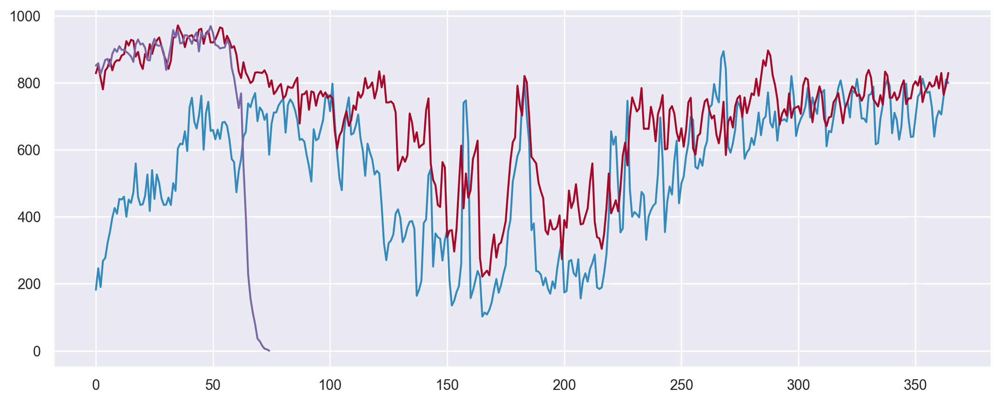

In [49]:
demonstrate_seasonality(occupancy_rate['occupancy_rate'], 365)

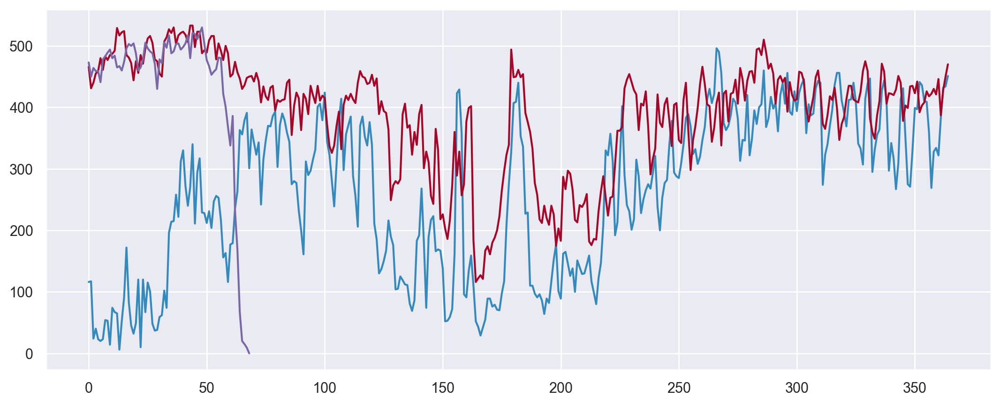

In [50]:
demonstrate_seasonality(city_or, 365)

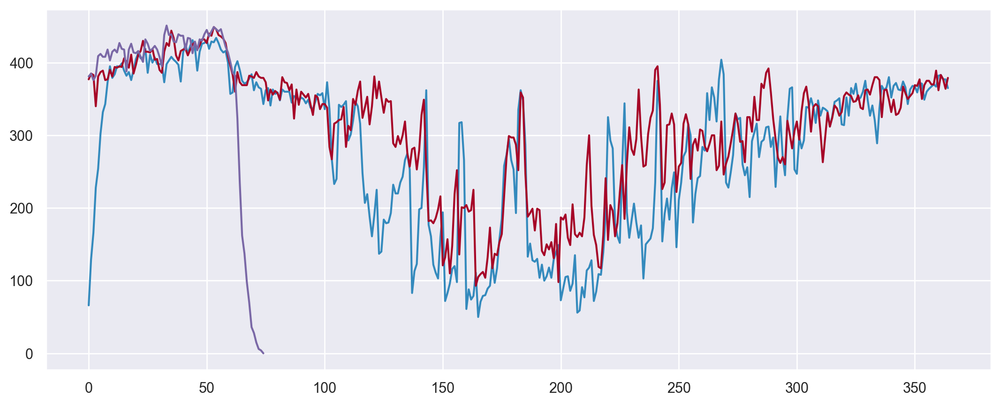

In [51]:
demonstrate_seasonality(resort_or, 365)

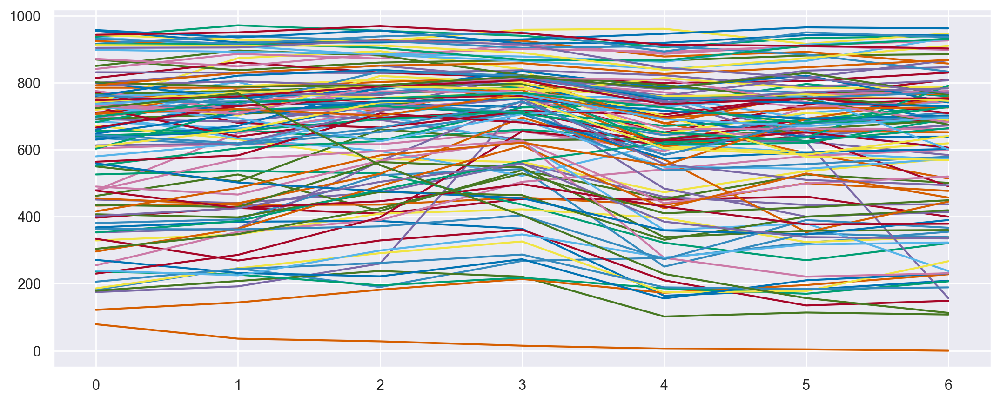

In [52]:
demonstrate_seasonality(occupancy_rate['occupancy_rate'], 7)

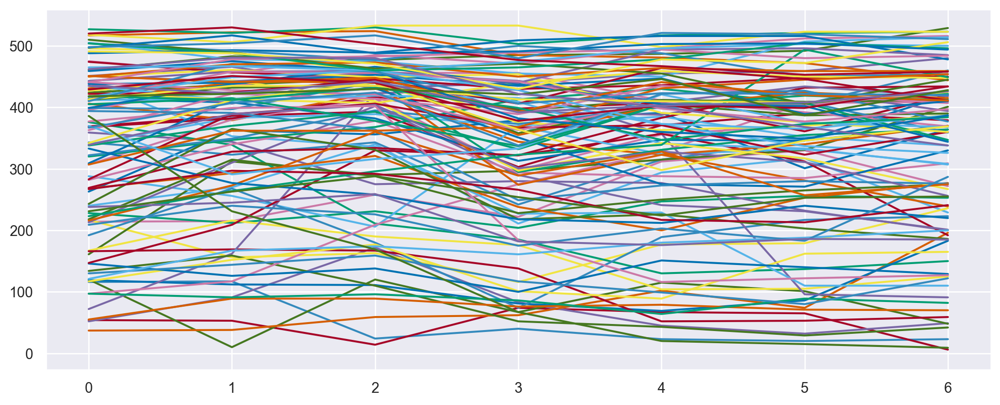

In [53]:
demonstrate_seasonality(city_or, 7)

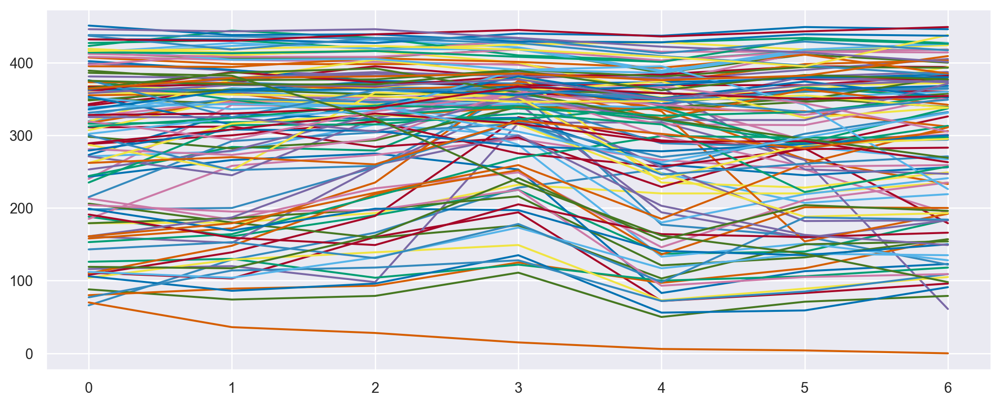

In [54]:
demonstrate_seasonality(resort_or, 7)

Далее посмотрим на то, какие значения `occupancy rate` встречаются чаще всего - построим гистограмму.

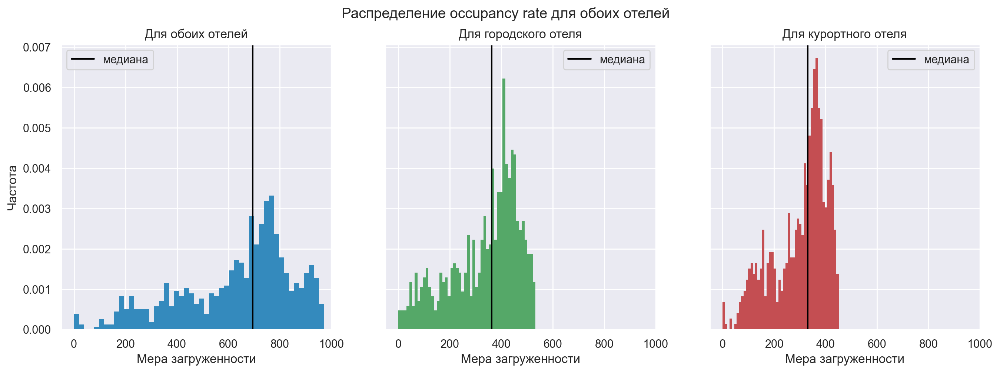

In [392]:
fig, axs = plt.subplots(1, 3, figsize=(16, 5), sharey=True)
fig.suptitle('Распределение occupancy rate для обоих отелей', fontsize=14)

axs[0].hist(x=occupancy_rate['occupancy_rate'].values, bins=50, lw=0., density=True)
axs[0].axvline(x=np.nanmedian(occupancy_rate.occupancy_rate), color='black', label='медиана')
axs[0].set_xlabel('Мера загруженности', fontsize=12)
axs[0].set_ylabel("Частота", fontsize=12)
axs[0].set_title('Для обоих отелей', fontsize=12)
axs[0].legend(loc='upper left')
axs[0].set_xlim(-50, 1000)

axs[1].hist(x=city_or['occupancy_rate'].values, bins=50, lw=0., color='g', density=True)
axs[1].axvline(x=np.nanmedian(city_or.values), color='black', label='медиана')
axs[1].set_xlabel('Мера загруженности', fontsize=12)
axs[1].set_title('Для городского отеля', fontsize=12)
axs[1].legend(loc='upper right')
axs[1].set_xlim(-50, 1000)

axs[2].hist(x=resort_or['occupancy_rate'].values, bins=50, lw=0., color='r', density=True)
axs[2].axvline(x=np.nanmedian(resort_or.values), color='black', label='медиана')
axs[2].set_xlabel('Мера загруженности', fontsize=12)
axs[2].set_title('Для курортного отеля', fontsize=12)
axs[2].legend(loc='upper right')
axs[2].set_xlim(-50, 1000)

plt.show()

Столбец `lead_time` крайне важный, поскольку он показывает, сколько дней прошло с момента бронирования до момента заезда, и благодаря ему, можно рассчитать день бронирования. Это позволит делать выводы о том, какой в среднем промежуток времени проходит между бронированием и заездом

Из-за того, что распределение этого параметра содержит "длинные хвосты", то есть присутствует немалое количество аномально высоких значений, более целесообразно считать медиану для получения среднестатистического значения периода ожидания

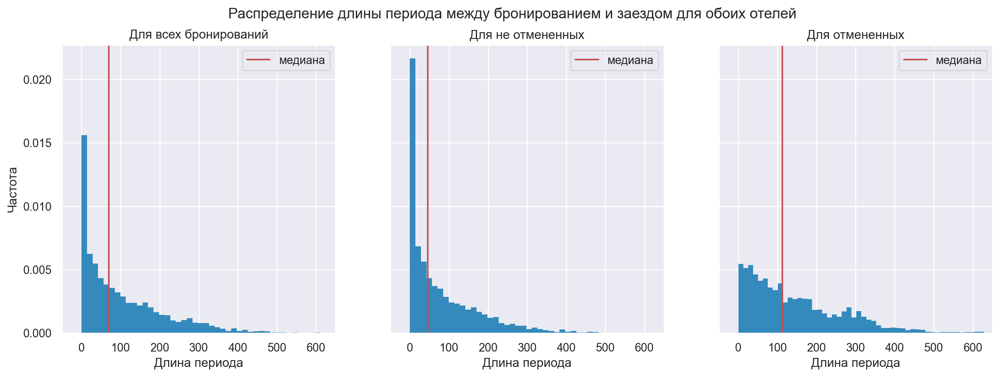

In [353]:
plt.rcParams['font.size'] = 14
fig, axs = plt.subplots(1, 3, figsize=(16, 5), sharey=True)
fig.suptitle('Распределение длины периода между бронированием и заездом для обоих отелей', fontsize=14)

axs[0].hist(x=data['lead_time'].values, bins=50, lw=0., density=True)
axs[0].axvline(x=np.nanmedian(data.lead_time), color='r', label='медиана')
axs[0].set_xlabel('Длина периода', fontsize=12)
axs[0].set_ylabel("Частота", fontsize=12)
axs[0].set_title('Для всех бронирований', fontsize=12)
axs[0].legend(loc='upper right')
axs[0].set_xlim(-50, 650)

axs[1].hist(x=data[data['is_canceled'] == 0]['lead_time'].values, bins=50, lw=0., density=True)
axs[1].axvline(x=np.nanmedian(data[data['is_canceled'] == 0].lead_time), color='r', label='медиана')
axs[1].set_xlabel('Длина периода', fontsize=12)
axs[1].set_title('Для не отмененных', fontsize=12)
axs[1].legend(loc='upper right')
axs[1].set_xlim(-50, 650)

axs[2].hist(x=data[data['is_canceled'] == 1]['lead_time'].values, bins=50, lw=0., density=True)
axs[2].axvline(x=np.nanmedian(data[data['is_canceled'] == 1].lead_time), color='r', label='медиана')
axs[2].set_xlabel('Длина периода', fontsize=12)
axs[2].set_title('Для отмененных', fontsize=12)
axs[2].legend(loc='upper right')
axs[2].set_xlim(-50, 650)

plt.show()

Из всех графиков видно, что чаще всего бронирования совершаются "день-в-день", то есть время, прошедшее с бронирования до заезда составляет 0 дней. Причем это высказывание справедливо как для городского отеля, так и для курортного. Более того, распределения длин этого периода можно назвать идентичными для обоих отелей, а также для реализованных бронирований. Для бронирований, которые потерпели отмену, распределение другое.

In [63]:
data['reservation_status_date'] = pd.to_datetime(data['reservation_status_date'])

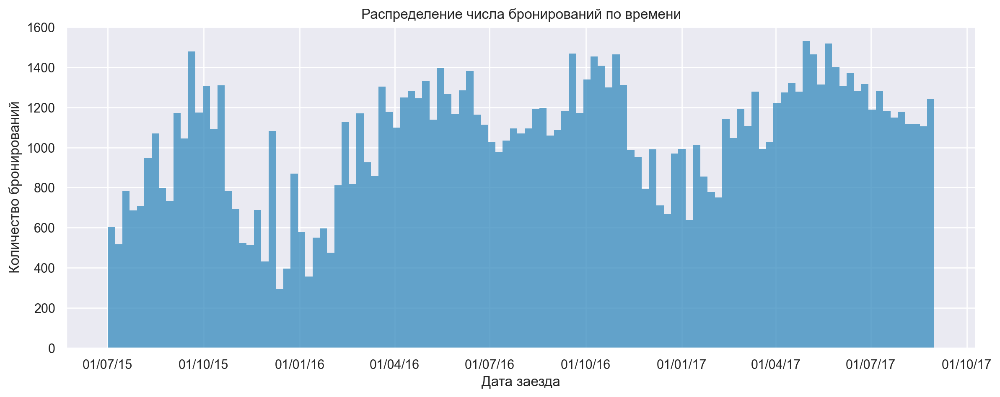

In [417]:
plt.rcParams['figure.figsize'] = 14, 5

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

sns.histplot(x='arrival_date', 
             data=data, 
             bins=int(data['arrival_date'].nunique() / 7), 
             lw=0.)
plt.xlabel('Дата заезда')
plt.ylabel('Количество бронирований')
plt.title('Распределение числа бронирований по времени')
plt.show()

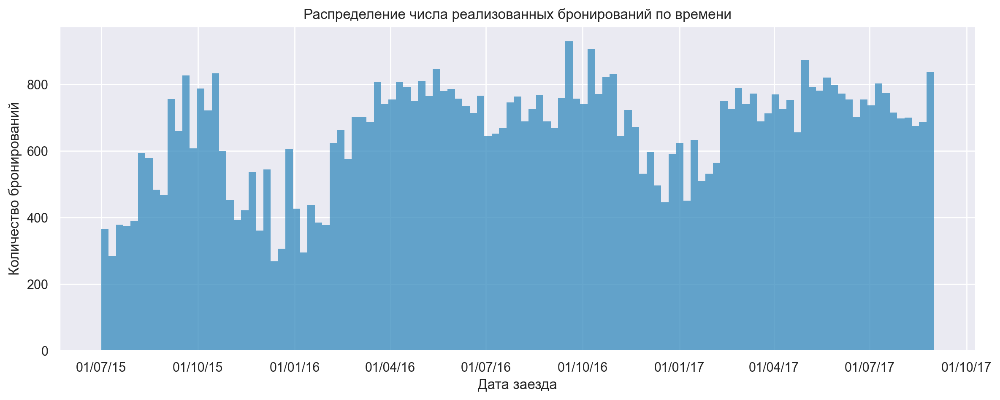

In [418]:
plt.rcParams['figure.figsize'] = 14, 5

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

sns.histplot(x='arrival_date', 
             data=data[data['is_canceled'] == 0], 
             bins=int(data['arrival_date'].nunique() / 7), 
             lw=0.)
plt.xlabel('Дата заезда')
plt.ylabel('Количество бронирований')
plt.title('Распределение числа реализованных бронирований по времени')
plt.show()

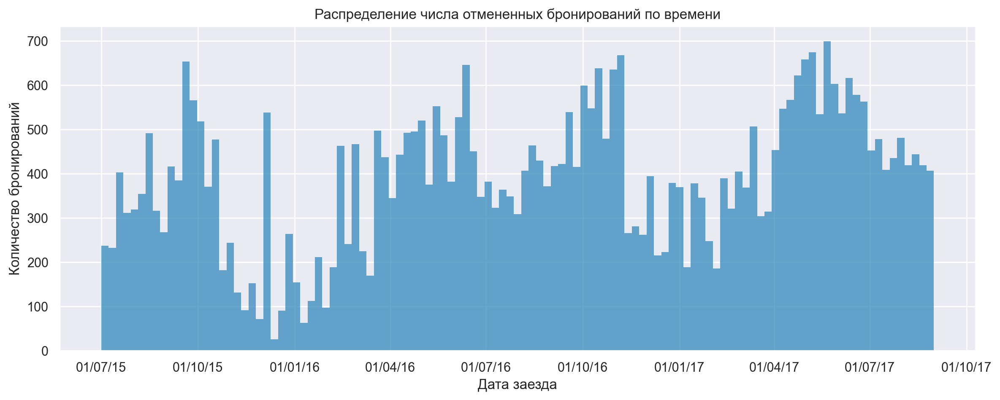

In [419]:
plt.rcParams['figure.figsize'] = 14, 5

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

sns.histplot(
    x='arrival_date', 
    data=data[data['is_canceled'] == 1], 
    bins=int(data['arrival_date'].nunique() / 7), 
    lw=0.)
plt.xlabel('Дата заезда')
plt.ylabel('Количество бронирований')
plt.title('Распределение числа отмененных бронирований по времени')
plt.show()

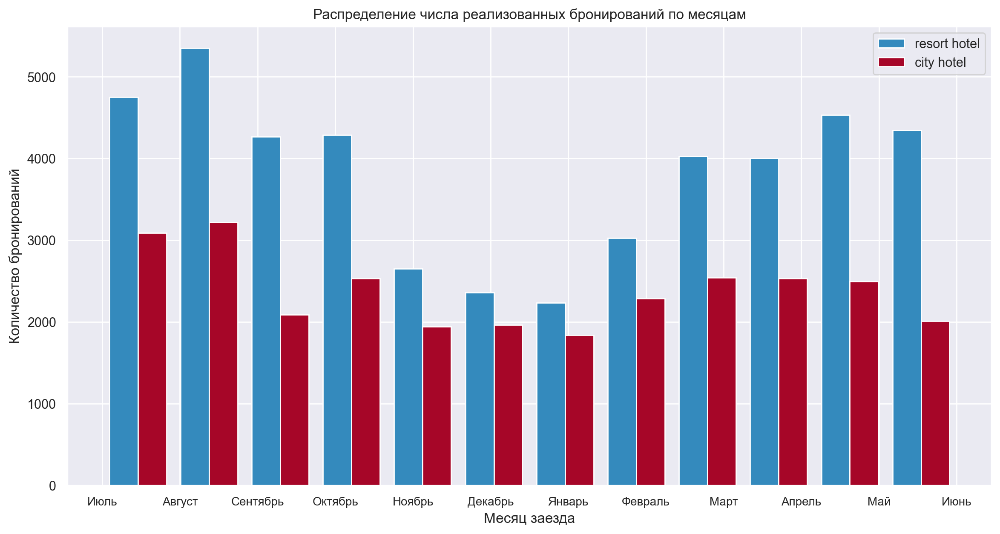

In [425]:
plt.rcParams['figure.figsize'] = 14, 7
# plt.style.use('bmh')

r = data[(data['is_canceled'] == 0) & (data['hotel'] == 'City Hotel')]['arrival_date_month']
c = data[(data['is_canceled'] == 0) & (data['hotel'] == 'Resort Hotel')]['arrival_date_month']

plt.hist(
    x=[r, c], 
    bins=data['arrival_date_month'].nunique(),
    label=['resort hotel', 'city hotel']
        )
plt.xlabel('Месяц заезда')
plt.ylabel('Количество бронирований')
plt.title('Распределение числа реализованных бронирований по месяцам')

ticks, _ = plt.xticks()
labels = ['Июль', 'Август',
          'Сентябрь', 'Октябрь', 
          'Ноябрь', 'Декабрь', 
          'Январь', 'Февраль', 
          'Март', 'Апрель', 
          'Май', 'Июнь']
plt.xticks(ticks, labels, fontsize=10)

plt.legend(loc='upper right')
plt.show()

Отсюда видно, что в среднем бронирований больше в курортном отеле, чем в городском. Для обоих отелей самым популярным месяцем является август, а самым непопулярным - январь.

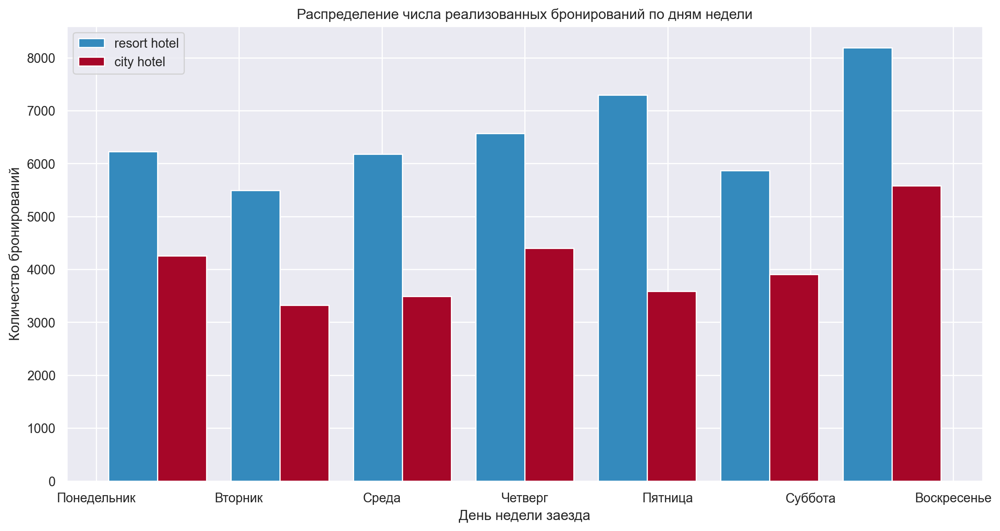

In [426]:
plt.rcParams['figure.figsize'] = 14, 7

r = data[(data['is_canceled'] == 0) & (data['hotel'] == 'City Hotel')]['reservation_status_date'].dt.weekday
c = data[(data['is_canceled'] == 0) & (data['hotel'] == 'Resort Hotel')]['reservation_status_date'].dt.weekday

plt.hist(
    x=[r, c], 
    bins=data['arrival_date'].dt.weekday.nunique(),
    label=['resort hotel', 'city hotel']
        )

ticks, labels = plt.xticks()
plt.xticks(
    [0, 1, 2, 3, 4, 5, 6],
    ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'])
plt.xlabel('День недели заезда')
plt.ylabel('Количество бронирований')
plt.title('Распределение числа реализованных бронирований по дням недели')
plt.legend(loc='upper left')
plt.show()

Самый популярный день недели для заезда в оба отеля - воскресенье, а самый непопулярный - вторник.

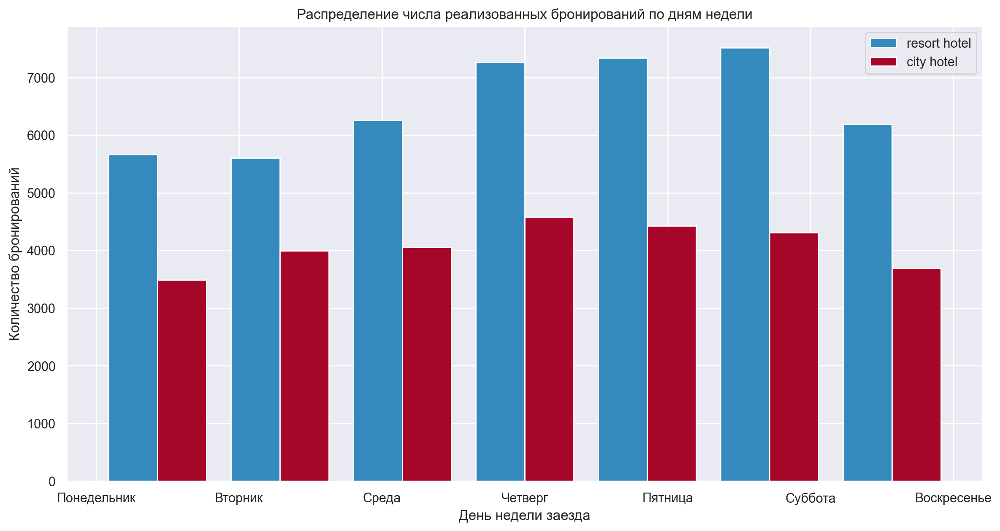

In [65]:
plt.rcParams['figure.figsize'] = 14, 7

r = data[(data['is_canceled'] == 0) & (data['hotel'] == 'City Hotel')]['booking_date'].dt.weekday
c = data[(data['is_canceled'] == 0) & (data['hotel'] == 'Resort Hotel')]['booking_date'].dt.weekday

plt.hist(
    x=[r, c], 
    bins=data['reservation_status_date'].dt.weekday.nunique(),
    label=['resort hotel', 'city hotel']
        )

ticks, labels = plt.xticks()
plt.xticks(
    [0, 1, 2, 3, 4, 5, 6],
    ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'])
plt.xlabel('День недели заезда')
plt.ylabel('Количество бронирований')
plt.title('Распределение числа реализованных бронирований по дням недели')
plt.legend(loc='upper right')
plt.show()

При этом самый популярный день для резервирования комнат - суббота для курортного отеля и четверг для городского, а самый непопулярный день резеревирования для обоих отелей - понедельник.

In [65]:
# функция создания таблицы с общим числом ночей
def count_nights(df, filters):
    gb_df = df.copy()[filters]
    gb_df = gb_df['stays_in_week_nights'] + gb_df['stays_in_weekend_nights']
    return gb_df.value_counts().reset_index().rename(columns={'index': 'nights', 0: 'count'})


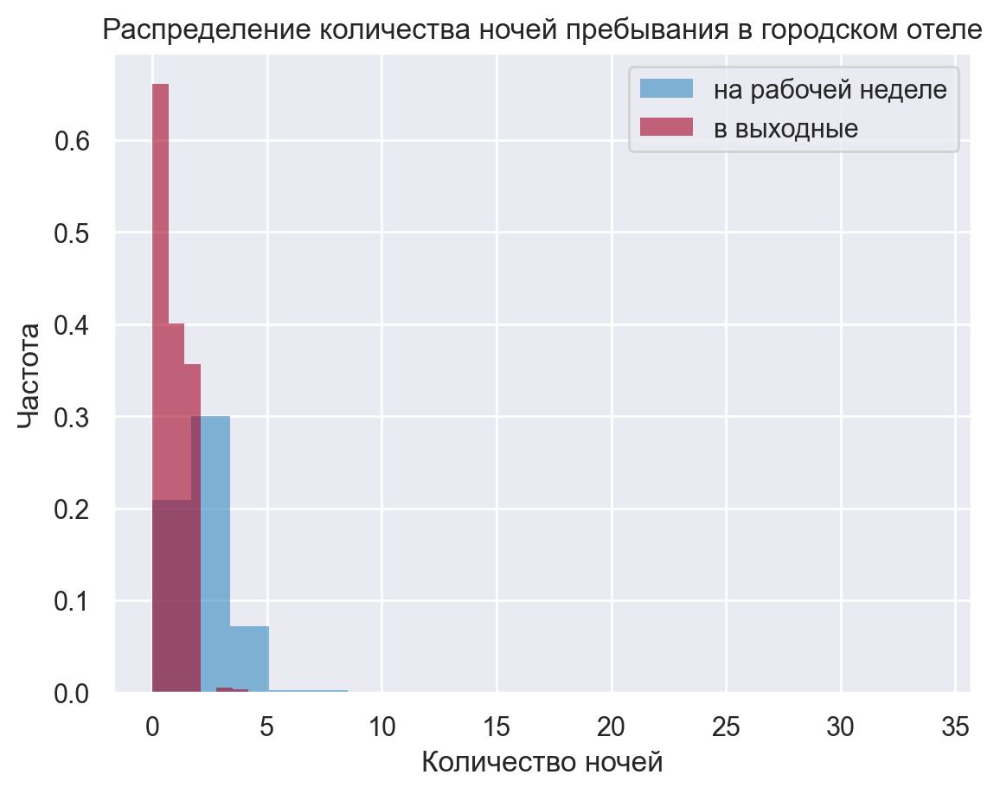

In [358]:
total_nights_city = count_nights(data, (data['hotel'] == 'City Hotel') & (data['is_canceled'] == 0))
total_nights_city = total_nights_city.sort_values(by=['nights'])
# plt.plot(total_nights_city['nights'].values, 
#          total_nights_city['count'].values,
#          label='всего ночей'
#         )

plt.hist(
    x=data[(data['hotel'] == 'City Hotel') & (data['is_canceled'] == 0)]['stays_in_week_nights'],
    bins=20,
    label='на рабочей неделе',
    alpha=0.6,
    lw=0.,
    density=True
        )
plt.hist(
    x=data[(data['hotel'] == 'City Hotel') & (data['is_canceled'] == 0)]['stays_in_weekend_nights'],
    bins=20,
    label='в выходные',
    alpha=0.6,
    lw=0.,
    density=True
        )

plt.xlabel('Количество ночей')
plt.ylabel('Частота')
plt.title('Распределение количества ночей пребывания в городском отеле')
plt.legend(loc='upper right')
plt.show()

Из графика видно, что бОльшая часть значений попадает в интервал от 0 до 10 ночей - других значений настолько мало, что они отсутствуют на графике. Поэтому ниже рассмотрим более подробно распределение значений в промежутке от 0 до 10 ночей

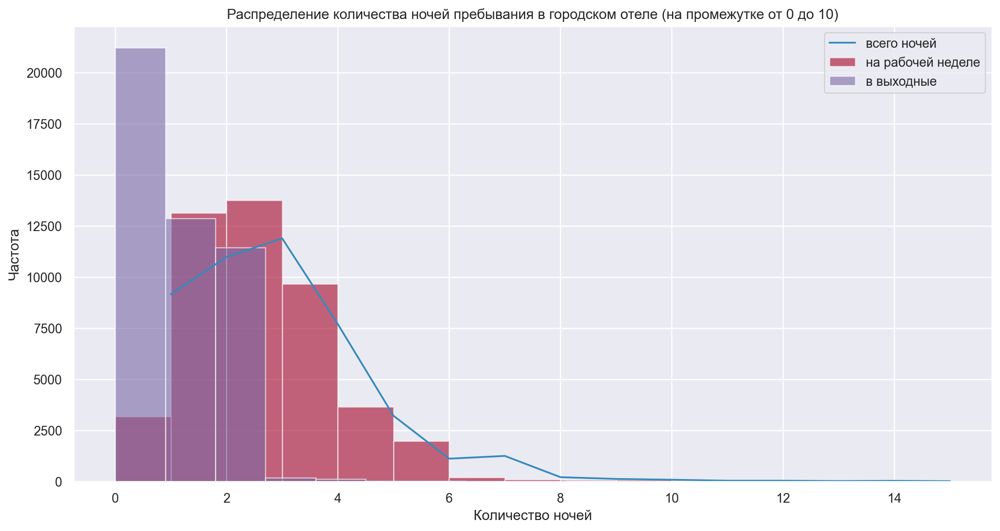

In [68]:
total_nights_city = count_nights(data, (data['hotel'] == 'City Hotel') & (data['is_canceled'] == 0) & \
                                 (data['stays_in_week_nights'] <= 10))
total_nights_city = total_nights_city.sort_values(by=['nights'])
plt.plot(total_nights_city['nights'].values, 
         total_nights_city['count'].values,
         label='всего ночей'
        )

plt.hist(
    x=data[(data['hotel'] == 'City Hotel') & \
           (data['is_canceled'] == 0) & \
           (data['stays_in_week_nights'] <= 10)]['stays_in_week_nights'],
    bins=10,
    label='на рабочей неделе',
    alpha=0.6
        )
plt.hist(
    x=data[(data['hotel'] == 'City Hotel') & \
           (data['is_canceled'] == 0) & \
           (data['stays_in_weekend_nights'] <= 10)]['stays_in_weekend_nights'],
    bins=10,
    label='в выходные',
    alpha=0.6
        )

plt.xlabel('Количество ночей')
plt.ylabel('Частота')
plt.title('Распределение количества ночей пребывания в городском отеле (на промежутке от 0 до 10)')
plt.legend(loc='upper right')
plt.show()

Мы посчитали только заезды, имеет смысл посмотреть, сколько людей остаются в отеле в зависимости от времени и дня недели

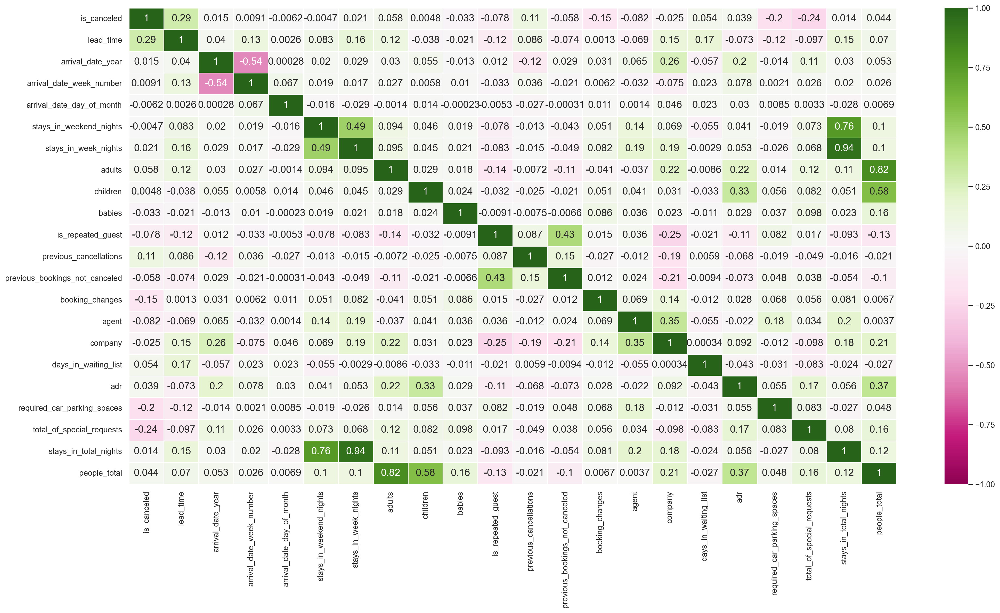

In [69]:
plt.figure(figsize = (24, 12))

corr = data.corr()
sns.heatmap(corr, annot=True, linewidths=1, vmax=1, vmin=-1, cmap="PiYG")
plt.show()

In [70]:
correlation = data.corr()['is_canceled'].abs().sort_values(ascending = False)
correlation

is_canceled                       1.000000
lead_time                         0.291659
total_of_special_requests         0.236202
required_car_parking_spaces       0.196845
booking_changes                   0.145176
previous_cancellations            0.109964
agent                             0.082309
is_repeated_guest                 0.077825
adults                            0.057609
previous_bookings_not_canceled    0.057560
days_in_waiting_list              0.053923
people_total                      0.044303
adr                               0.039415
babies                            0.032688
company                           0.024804
stays_in_week_nights              0.020963
arrival_date_year                 0.015368
stays_in_total_nights             0.013824
arrival_date_week_number          0.009072
arrival_date_day_of_month         0.006159
children                          0.004780
stays_in_weekend_nights           0.004667
Name: is_canceled, dtype: float64

In [428]:
def plot_cat_dependencies(data, cat_feature, title="", xlabel=''):
    gb_hotel = pd.DataFrame(data.groupby([cat_feature, 'is_canceled'])[cat_feature].count())
    gb_hotel = gb_hotel.rename(columns={cat_feature: 'count'}).reset_index()

    sns.barplot(data=gb_hotel, x=cat_feature, y='count', hue='is_canceled')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Количество')
    plt.show()

По графику видно, что для городского отеля как отмен, так и бронирований с их отсутствием было больше, чем в курортном отеле. Однако отношение числа отмен к остальным бронированиям все-таки выше в городском отеле, чем в курортном

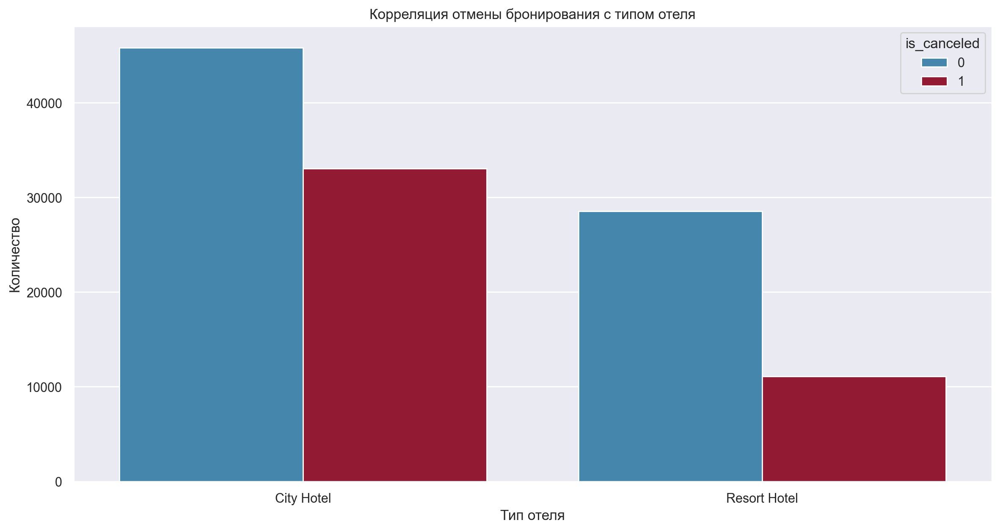

In [72]:
plot_cat_dependencies(
    data, 
    'hotel', 
    title='Корреляция отмены бронирования с типом отеля', 
    xlabel='Тип отеля'
)

Из графика ниже видно, что для всех сегментом рынка, кроме одного, бОльшую часть бронирований не отменяют. Только в сегменте "Группы" преобладают отмененные бронирования

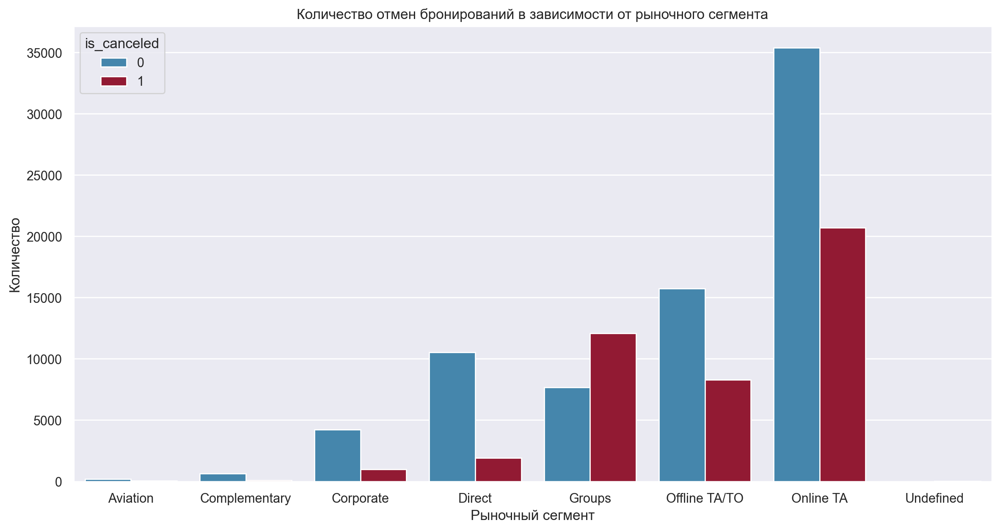

In [432]:
plot_cat_dependencies(
    data, 
    'market_segment', 
    title='Количество отмен бронирований в зависимости от рыночного сегмента', 
    xlabel='Рыночный сегмент'
)

По графику влияния канала распространения информации об отеле на отмены бронирований нельзя сделать вывод о связи признака с целевой переменной

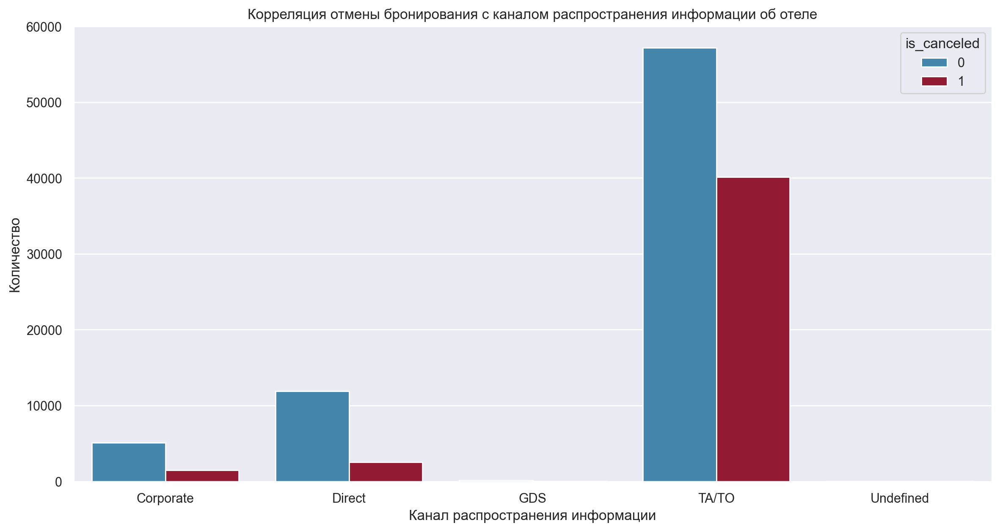

In [74]:
plot_cat_dependencies(
    data, 
    'distribution_channel', 
    title='Корреляция отмены бронирования с каналом распространения информации об отеле', 
    xlabel='Канал распространения информации'
)

Большинство туристов, посещающих отель, приезжают из Португалии. Это позволяет сделать вывод о том, что, вероятно, оба отля находятся именно в этой стране. Интересное замечание, что в Португалии отмены преобладают над неотмененными бронированиями. Это может быть свяано с тем, что туристы из других стран сталкиваются с большим числом трудностей при планировании отпуска, что и вызывает менее охотную отмену бронирований.

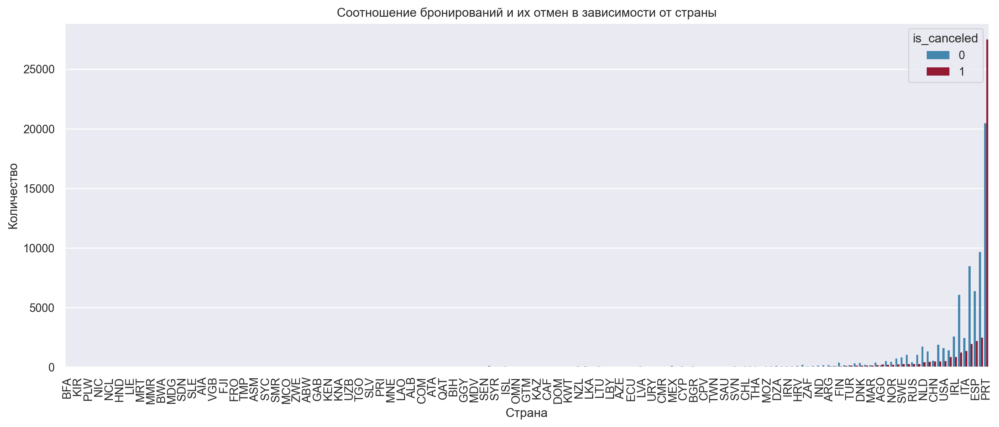

In [67]:
cat_feature = 'country'
gb_country = pd.DataFrame(data.groupby([cat_feature, 'is_canceled'])[cat_feature].count())
gb_country = gb_country.rename(columns={cat_feature: 'count'}).reset_index()

plt.figure(figsize=(16, 6))
sns.barplot(
    data=gb_country, 
    x=cat_feature, 
    y='count', 
    hue='is_canceled', 
    order=gb_country.sort_values('count').country.unique(),
    lw=0.)

plt.title('Соотношение бронирований и их отмен в зависимости от страны')
plt.xlabel('Страна')
ticks, labels = plt.xticks()
plt.xticks(ticks[::2], labels[::2], rotation=90)
plt.ylabel('Количество')
plt.show()

Стран, в которых количество отмен преобладает, всего 43, причем в большинстве из них бронирования единичны (то есть суммарное число бронирований не превышает 20)

In [68]:
country_canc1 = gb_country[gb_country['is_canceled'] == 1].drop(columns=['is_canceled'])
country_canc1 = country_canc1.rename(columns={'count': 'count1'}).set_index('country')
country_canc0 = gb_country[gb_country['is_canceled'] == 0].drop(columns=['is_canceled'])
country_canc0 = country_canc0.rename(columns={'count': 'count0'}).set_index('country')

country_count = pd.concat(
    [country_canc1, country_canc0], 
    join='outer',
    axis=1
).fillna(0)

country_count[country_count['count1'] >= country_count['count0']].shape

(43, 2)

In [69]:
gb_country = pd.DataFrame(data.groupby(['country', 'is_canceled'])['country'].count())
gb_country[gb_country['country'] == gb_country['country'].max()]

,,country
country,is_canceled,
PRT,1,27494


Ниже представлена карта с распределением стран, откуда приезжали гости. Большая часть постояльцев из Европы, преимущественно из западной ее части, в большинстве случаев из Португалии.

In [70]:
gb_country = gb_country.rename(columns={'country': 'count'}).reset_index()

In [71]:
country_stays = gb_country[gb_country['is_canceled'] == 0][['country', 'count']]

In [83]:
basemap = folium.Map()
guests_map = px.choropleth(country_stays, 
                           locations=country_stays['country'],
                           color_continuous_scale="Viridis",
                           color=country_stays['count'], 
                           hover_name=country_stays['country'])
guests_map.show()

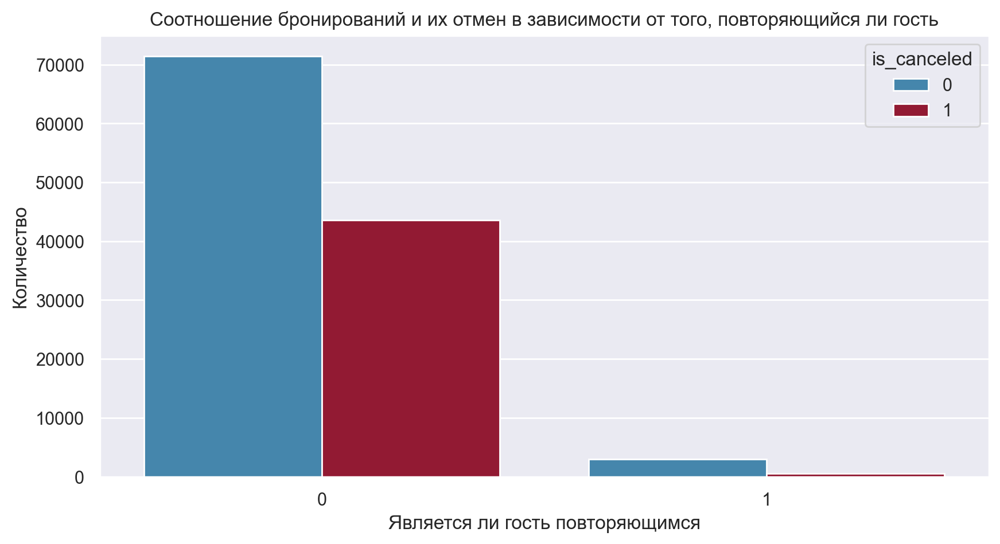

In [84]:
plt.figure(figsize=(10, 5))
plot_cat_dependencies(
    data, 
    'is_repeated_guest', 
    title='Соотношение бронирований и их отмен в зависимости от того, повторяющийся ли гость', 
    xlabel='Является ли гость повторяющимся'
)

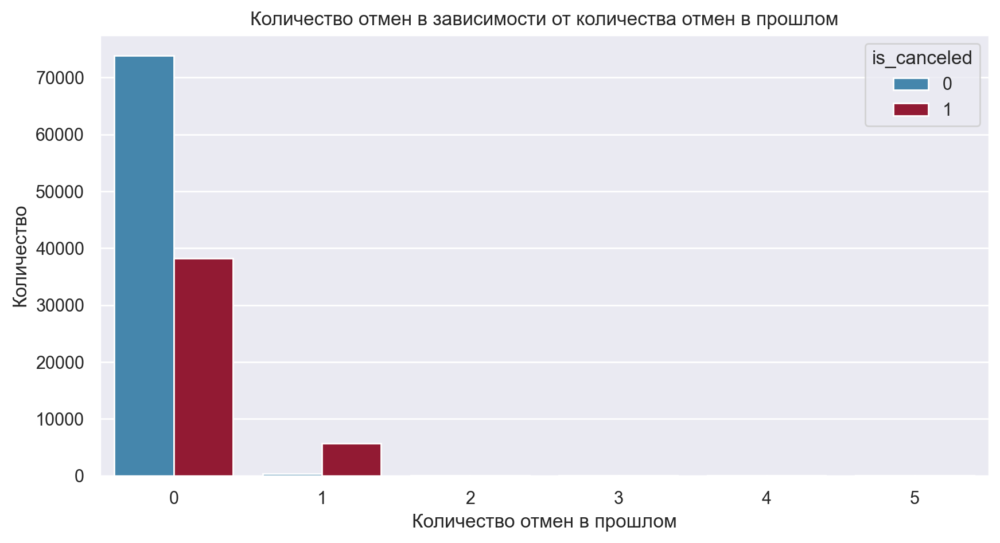

In [431]:
plt.figure(figsize=(10, 5))
plot_cat_dependencies(
    data[data['previous_cancellations'] <= 5], 
    'previous_cancellations', 
    title='Количество отмен в зависимости от количества отмен в прошлом', 
    xlabel='Количество отмен в прошлом'
)

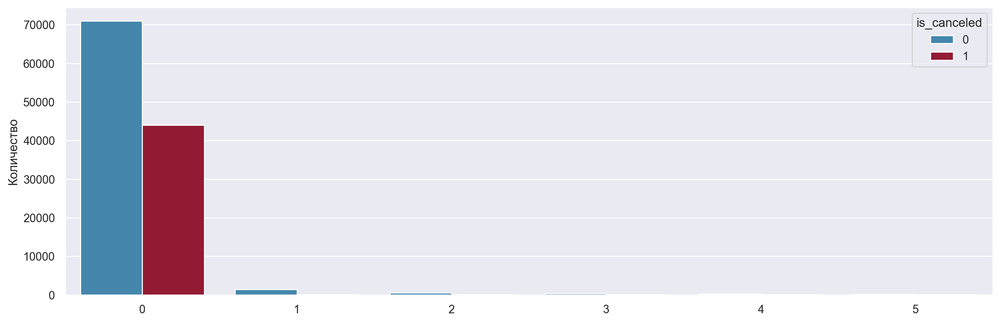

In [86]:
plt.figure(figsize=(16, 5))
plot_cat_dependencies(
    data[data['previous_bookings_not_canceled'] <= 5], 
    'previous_bookings_not_canceled', 
    title='', 
    xlabel=''
)

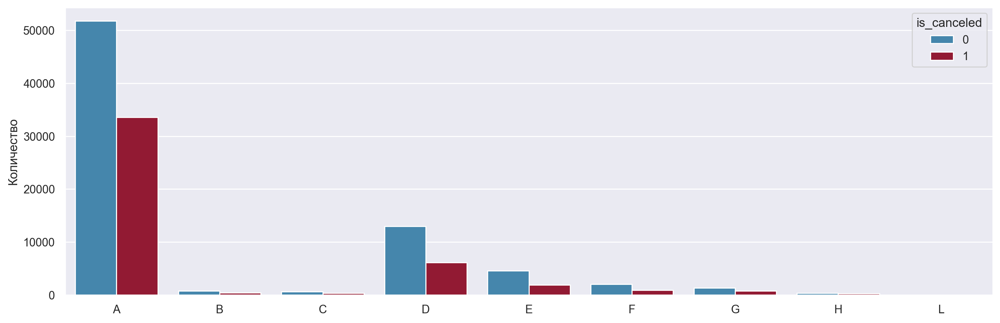

In [87]:
plt.figure(figsize=(16, 5))
plot_cat_dependencies(
    data, 
    'reserved_room_type', 
    title='', 
    xlabel=''
)

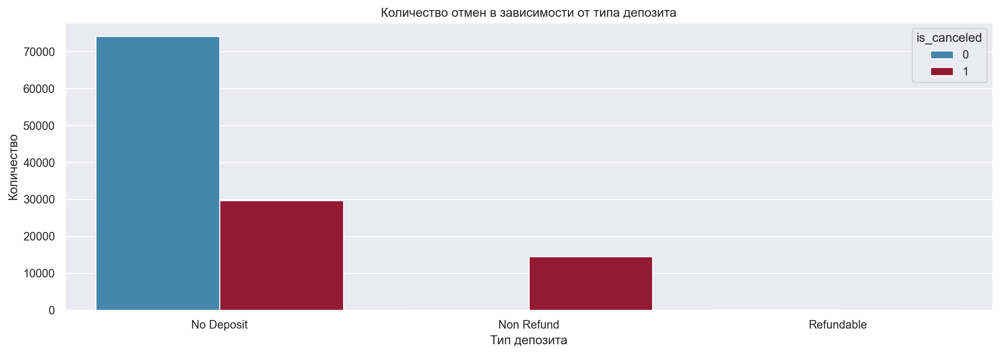

In [430]:
plt.figure(figsize=(16, 5))
plot_cat_dependencies(
    data, 
    'deposit_type', 
    title='Количество отмен в зависимости от типа депозита', 
    xlabel='Тип депозита'
)

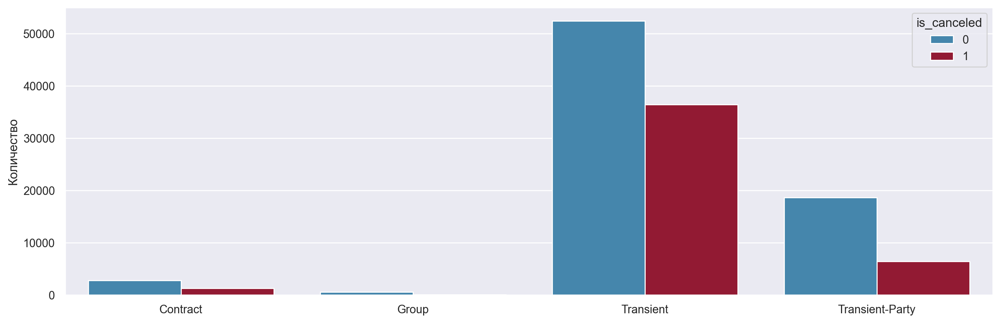

In [89]:
plt.figure(figsize=(16, 5))
plot_cat_dependencies(
    data, 
    'customer_type', 
    title='', 
    xlabel=''
)

In [72]:
data[(data['deposit_type'] == 'Refundable')].shape

(162, 37)

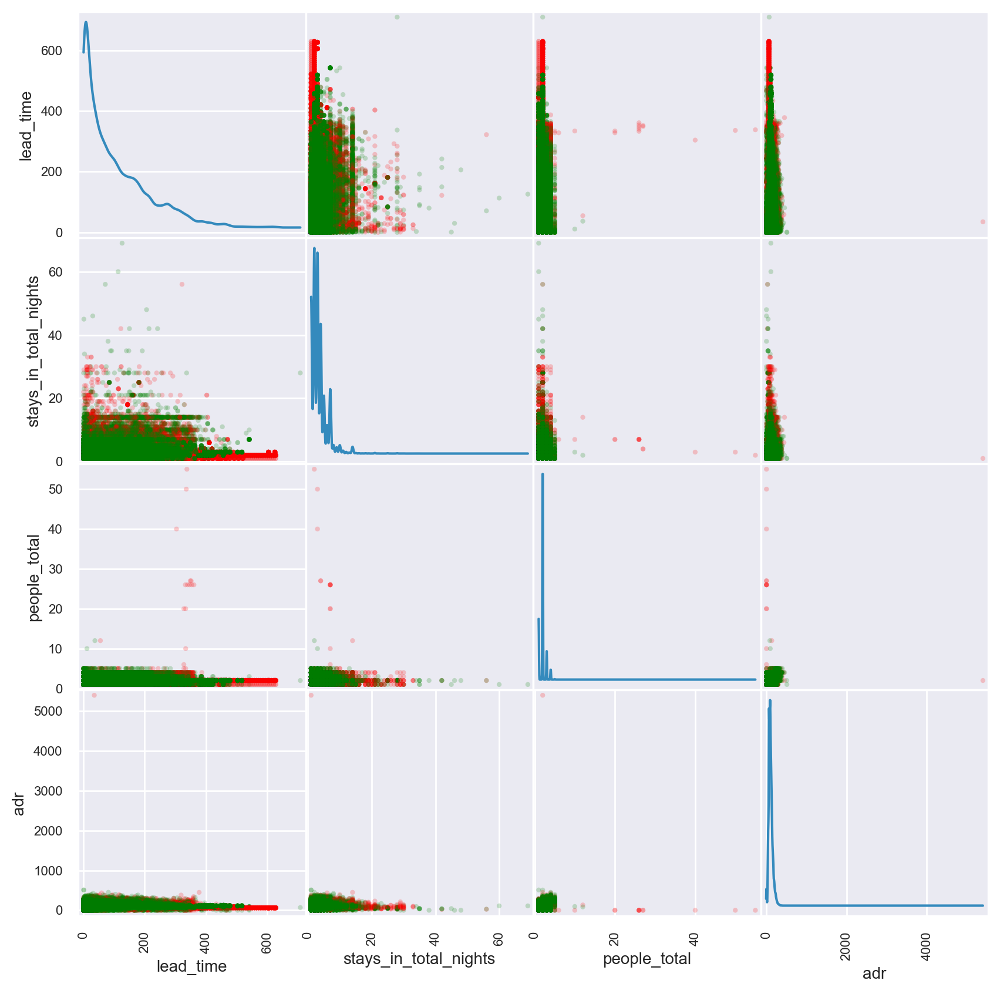

In [389]:
columns = [
    'lead_time',
    'stays_in_total_nights',
    'people_total',
    'adr'
]
colors = {1: 'red', 0: 'green'}
scatter_matrix = pd.plotting.scatter_matrix(
    data[columns],
    figsize=(10, 10),
    diagonal='kde',
    c=data['is_canceled'].replace(colors),
    alpha=0.2,
    marker="."
)

for ax in scatter_matrix.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize = 10)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 10)

plt.show()

# Preprocessing

Какие параметры точно нельзя будет спользовать при прогнозировании: все, что связано не с бронированием или предпочтениями гостя, а с фактами, произошедшими после заезда - то есть фактическая дата выселения, фактический статус и сама целевая переменная - факт отмены. Также во время обучения невозможно использовать даты и текстовые признаки в чистом виде - даты необходимо разбить на составляющие (год, месяц, день месяца, номер недели, день недели), а текстовые (категориальные) переменные перекодировать в другие форматы. Также придется исключить из рассмтотрения признаки, находящиеся в линейной зависимости с другими признаками (как `total_nights`, `week_nights` и `weekend_nights`, например)

Таким образом, из рассмотрения однозначно будут исключены:
* `reservation_status`
* `reservation_status_date`
* `checkout_date`
* `arrival_date`
* `stays_in_total_nights`
* `people_total`
* `assigned_room_type`
* `country`

`checkout date` предлагается исключить, так как этот параметр предсталяет из себя дату - такой формат данных нельзя использовать при обучении модели, и к тому же эта дата линейно зависима от двух других параметров: `arrival_date`, `total_nights`

также предлагается исключить `country`, так как этот параметр имеет слишком много значений, которые крайне трудно закодировать при том, что сильного влияния на целевую переменную он не оказывает

В качестве категориальных переменных можно выделить следующие:
* `country`
* `market_segment`
* `distribution_channel`
* `is_repeated_guest`
* `reserved_room_type`
* `deposit_type`
* `agent`
* `company`
* `customer_type`

In [298]:
# ПЕРЕДЕЛАТЬ!!!
def map_columns(datatr_cat):  
    datatr_cat['hotel'] = datatr_cat['hotel'].map({'Resort Hotel': 0, 'City Hotel': 1})

    datatr_cat['meal'] = datatr_cat['meal'].map({'BB': 0, 'FB': 1, 'HB': 2, 'SC': 3, 'Undefined': 4})

    datatr_cat['market_segment'] = datatr_cat['market_segment'].map({'Direct': 0, 
                                                                     'Corporate': 1, 
                                                                     'Online TA': 2, 
                                                                     'Offline TA/TO': 3,
                                                                     'Complementary': 4,
                                                                     'Groups': 5,
                                                                     'Undefined': 6,
                                                                     'Aviation': 7})

    datatr_cat['distribution_channel'] = datatr_cat['distribution_channel'].map({'Direct': 0, 
                                                                                 'Corporate': 1,
                                                                                 'TA/TO': 2,
                                                                                 'Undefined': 3,
                                                                                 'GDS': 4})

    datatr_cat['reserved_room_type'] = datatr_cat['reserved_room_type'].map({'C': 0,
                                                                             'A': 1,
                                                                             'D': 2,
                                                                             'E': 3,
                                                                             'G': 4,
                                                                             'F': 5,
                                                                             'H': 6,
                                                                             'L': 7,
                                                                             'B': 8})

    datatr_cat['deposit_type'] = datatr_cat['deposit_type'].map({'No Deposit': 0, 
                                                                 'Refundable': 1, 
                                                                 'Non Refund': 3})

    datatr_cat['customer_type'] = datatr_cat['customer_type'].map({'Transient': 0, 
                                                                   'Contract': 1,
                                                                   'Transient-Party': 2,
                                                                   'Group': 3})

    datatr_cat['arrival_date_year'] = datatr_cat['arrival_date_year'].map({2015: 0, 
                                                                           2014: 1, 
                                                                           2016: 2, 
                                                                           2017: 3})

    datatr_cat['arrival_date_month'] = datatr_cat['arrival_date_month'].map({'January': 1, 
                                                                             'February': 2, 
                                                                             'March': 3, 
                                                                             'April': 4,
                                                                             'May': 5, 
                                                                             'June': 6, 
                                                                             'July': 7, 
                                                                             'August': 8,
                                                                             'September': 9, 
                                                                             'October': 10, 
                                                                             'November': 11, 
                                                                             'December': 12
                                                                            })
    return datatr_cat

In [ ]:
def preprocess(dataset,
               cat_encoding=None,
               log=False
              ):
    data = dataset.copy()
    
    # удаление столбцов, которы не понадобятся при обучении
    data = data.drop(columns=['reservation_status', 
                              'reservation_status_date',
                              'chekcout_date', 
                              'arrival_date',
                              'stays_in_total_nights',
                              'people_total',
                              'assigned_room_type',
                              'country',
                              'booking_date',
                              'days_in_waiting_list'
                             ]
                    )
    
    # заполнение пропусков
    data = data.fillna(0)
    
    
    cat_cols = [col for col in data.columns if data[col].dtype == 'O']
    if cat_encoding = 'label':
        cat_cols = cat_cols + ['arrival_date_year']
        
        cat_df = data[cat_cols]
        
        cat_df = map_columns(cat_df)
    else:
        cat_df = pd.get_dummies(data[cat_cols], drop_first=True)
        
    num_df = data.drop(columns=cat_cols)
    num_df.drop('is_canceled', axis=1, inplace=True)
    
    data_train = pd.concat([cat_df, num_df], axis=1)
    
    if log:
        norm_cols = ['lead_time', 
                 'stays_in_weekend_nights', 
                 'stays_in_week_nights', 
                 'adults', 
                 'children',
                 'babies',
                 'previous_cancellations',
                 'previous_bookings_not_canceled',
                 'booking_changes',
                 'company',
                 'required_car_parking_spaces',
                 'total_of_special_requests'
                ]

        data_train[norm_cols] = np.log(data_train[norm_cols] + 1)
    
    return data_train

In [73]:
data_train = data.drop(columns=['reservation_status', 
                                'reservation_status_date', 
                                'chekcout_date', 
                                'arrival_date',
                                'stays_in_total_nights',
                                'people_total',
                                'assigned_room_type',
                                'country',
                                'booking_date',
                                'days_in_waiting_list'
                               ]
                      )

In [168]:
data_train.to_csv('data_train.csv', index=False)

In [74]:
data_train = data_train.fillna(0)

In [94]:
ohe_cols = [col for col in data_train.columns if data_train[col].dtype == 'O']
# cat_cols.append('arrival_date_year')
ohe_cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type']

In [95]:
label_cols = ohe_cols + ['arrival_date_year']

In [96]:
datatr_cat = data_train[label_cols]

In [152]:
datatr_ohe = data_train[ohe_cols]

In [100]:
datatr_cat['hotel'] = datatr_cat['hotel'].map({'Resort Hotel' : 0, 'City Hotel' : 1})

datatr_cat['meal'] = datatr_cat['meal'].map({'BB' : 0, 'FB': 1, 'HB': 2, 'SC': 3, 'Undefined': 4})

datatr_cat['market_segment'] = datatr_cat['market_segment'].map({'Direct': 0, 
                                                         'Corporate': 1, 
                                                         'Online TA': 2, 
                                                         'Offline TA/TO': 3,
                                                         'Complementary': 4, 
                                                         'Groups': 5, 
                                                         'Undefined': 6, 
                                                         'Aviation': 7})

datatr_cat['distribution_channel'] = datatr_cat['distribution_channel'].map({'Direct': 0, 
                                                                     'Corporate': 1, 
                                                                     'TA/TO': 2, 
                                                                     'Undefined': 3,
                                                                     'GDS': 4})

datatr_cat['reserved_room_type'] = datatr_cat['reserved_room_type'].map({'C': 0, 
                                                                 'A': 1, 
                                                                 'D': 2, 
                                                                 'E': 3, 
                                                                 'G': 4, 
                                                                 'F': 5, 
                                                                 'H': 6,
                                                                 'L': 7, 
                                                                 'B': 8})

datatr_cat['deposit_type'] = datatr_cat['deposit_type'].map({'No Deposit': 0, 'Refundable': 1, 'Non Refund': 3})

datatr_cat['customer_type'] = datatr_cat['customer_type'].map({'Transient': 0, 
                                                       'Contract': 1, 
                                                       'Transient-Party': 2, 
                                                       'Group': 3})

datatr_cat['arrival_date_year'] = datatr_cat['arrival_date_year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

datatr_cat['arrival_date_month'] = datatr_cat['arrival_date_month'].map({'January': 1, 
                                                                         'February': 2, 
                                                                         'March': 3, 
                                                                         'April': 4,
                                                                         'May': 5, 
                                                                         'June': 6, 
                                                                         'July': 7, 
                                                                         'August': 8,
                                                                         'September': 9, 
                                                                         'October': 10, 
                                                                         'November': 11, 
                                                                         'December': 12
                                                                        })

/var/folders/ww/w2n2kpsd3rvbzkdllh6lw9pw0000gr/T/ipykernel_11746/2770624195.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datatr_cat['hotel'] = datatr_cat['hotel'].map({'Resort Hotel' : 0, 'City Hotel' : 1})
/var/folders/ww/w2n2kpsd3rvbzkdllh6lw9pw0000gr/T/ipykernel_11746/2770624195.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datatr_cat['meal'] = datatr_cat['meal'].map({'BB' : 0, 'FB': 1, 'HB': 2, 'SC': 3, 'Undefined': 4})
/var/folders/ww/w2n2kpsd3rvbzkdllh6lw9pw0000gr/T/ipykernel_11746/277062

In [153]:
datatr_ohe = pd.get_dummies(datatr_ohe, drop_first=True)
datatr_ohe.head()

,hotel_Resort Hotel,arrival_date_month_August,arrival_date_month_December,arrival_date_month_February,arrival_date_month_January,arrival_date_month_July,arrival_date_month_June,arrival_date_month_March,arrival_date_month_May,arrival_date_month_November,...,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,deposit_type_Non Refund,deposit_type_Refundable,customer_type_Group,customer_type_Transient,customer_type_Transient-Party
2,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
6,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [101]:
datatr_cat.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,arrival_date_year
2,0,7,0,0,0,1,0,0,0
3,0,7,0,1,1,1,0,0,0
4,0,7,0,2,2,1,0,0,0
5,0,7,0,2,2,1,0,0,0
6,0,7,0,0,0,0,0,0,0


In [102]:
num_df_label = data_train.drop(columns=label_cols)
num_df_label.drop('is_canceled', axis=1, inplace=True)
num_df_label

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests
2,7,27,1,0,1,1,0.0,0,0,0,0,0,0.0,0.0,75.00,0,0
3,13,27,1,0,1,1,0.0,0,0,0,0,0,304.0,0.0,75.00,0,0
4,14,27,1,0,2,2,0.0,0,0,0,0,0,240.0,0.0,98.00,0,1
5,14,27,1,0,2,2,0.0,0,0,0,0,0,240.0,0.0,98.00,0,1
6,0,27,1,0,2,2,0.0,0,0,0,0,0,0.0,0.0,107.00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,23,35,30,2,5,2,0.0,0,0,0,0,0,394.0,0.0,96.14,0,0
119386,102,35,31,2,5,3,0.0,0,0,0,0,0,9.0,0.0,225.43,0,2
119387,34,35,31,2,5,2,0.0,0,0,0,0,0,9.0,0.0,157.71,0,4
119388,109,35,31,2,5,2,0.0,0,0,0,0,0,89.0,0.0,104.40,0,0


In [125]:
num_df_ohe = data_train.drop(columns=ohe_cols)
num_df_ohe.drop('is_canceled', axis=1, inplace=True)
num_df_ohe

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,adr,required_car_parking_spaces,total_of_special_requests
2,7,2015,27,1,0,1,1,0.0,0,0,0,0,0,0.0,0.0,75.00,0,0
3,13,2015,27,1,0,1,1,0.0,0,0,0,0,0,304.0,0.0,75.00,0,0
4,14,2015,27,1,0,2,2,0.0,0,0,0,0,0,240.0,0.0,98.00,0,1
5,14,2015,27,1,0,2,2,0.0,0,0,0,0,0,240.0,0.0,98.00,0,1
6,0,2015,27,1,0,2,2,0.0,0,0,0,0,0,0.0,0.0,107.00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,23,2017,35,30,2,5,2,0.0,0,0,0,0,0,394.0,0.0,96.14,0,0
119386,102,2017,35,31,2,5,3,0.0,0,0,0,0,0,9.0,0.0,225.43,0,2
119387,34,2017,35,31,2,5,2,0.0,0,0,0,0,0,9.0,0.0,157.71,0,4
119388,109,2017,35,31,2,5,2,0.0,0,0,0,0,0,89.0,0.0,104.40,0,0


In [154]:
df_label = pd.concat([datatr_cat, num_df_label], axis=1)
df_ohe = pd.concat([datatr_ohe, num_df_ohe], axis=1)

In [155]:
df_label.shape, df_ohe.shape

((118540, 26), (118540, 58))

Проведем нормализацию до того, как будет разделять на треин и тест

In [162]:
norm_cols = ['lead_time', 
             'stays_in_weekend_nights', 
             'stays_in_week_nights', 
             'adults', 
             'children',
             'babies',
             'previous_cancellations',
             'previous_bookings_not_canceled',
             'booking_changes',
             'company',
             'required_car_parking_spaces',
             'total_of_special_requests'
            ]
scale_cols = ['arrival_date_week_number', 
              'arrival_date_day_of_month',
              'agent',
              'adr',
              'arrival_date_year'
             ]
do_nothing_cols = ['is_repeated_guest']

In [164]:
df_label_log = df_label.copy()
df_label_log[norm_cols] = np.log(df_label[norm_cols] + 1)

df_ohe_log = df_ohe.copy()
df_label_log[norm_cols] = np.log(df_ohe[norm_cols] + 1)

А вот масштабирование необходимо для всех данных, но его мы применим только после разделения на треин и тест, чтобы не было утечек.

In [170]:
X_lab_train, X_lab_test, y_lab_train, y_lab_test = train_test_split(
    df_label, 
    data_train['is_canceled'], 
    test_size=0.3, 
    stratify=data_train['is_canceled'],
    random_state=42
)

X_lablog_train, X_lablog_test, y_lablog_train, y_lablog_test = train_test_split(
    df_label_log, 
    data_train['is_canceled'], 
    test_size=0.3, 
    stratify=data_train['is_canceled'],
    random_state=42
)

X_ohe_train, X_ohe_test, y_ohe_train, y_ohe_test = train_test_split(
    df_ohe, 
    data_train['is_canceled'], 
    test_size=0.3, 
    stratify=data_train['is_canceled'],
    random_state=42
)

X_ohelog_train, X_ohelog_test, y_ohelog_train, y_ohelog_test = train_test_split(
    df_ohe_log, 
    data_train['is_canceled'], 
    test_size=0.3, 
    stratify=data_train['is_canceled'],
    random_state=42
)

А теперь поделим тренировочную выборку на тренировочную и валидационную

In [198]:
X_lab_train1, X_lab_val, y_lab_train1, y_lab_val = train_test_split(
    X_lab_train, 
    y_lab_train, 
    test_size=0.2, 
    stratify=y_lab_train,
    random_state=42
)

X_lablog_train1, X_lablog_val, y_lablog_train1, y_lablog_val = train_test_split(
    X_lablog_train, 
    y_lablog_train, 
    test_size=0.2, 
    stratify=y_lablog_train,
    random_state=42
)

X_ohe_train1, X_ohe_val, y_ohe_train1, y_ohe_val = train_test_split(
    X_ohe_train, 
    y_ohe_train, 
    test_size=0.2, 
    stratify=y_ohe_train,
    random_state=42
)

X_ohelog_train1, X_ohelog_val, y_ohelog_train1, y_ohelog_val = train_test_split(
    X_ohelog_train, 
    y_ohelog_train, 
    test_size=0.2, 
    stratify=y_ohelog_train,
    random_state=42
)

In [115]:
# data_preprocessed = pd.concat([datatr_cat, num_df, data_train['is_canceled']], axis=1)
# data_preprocessed.to_csv('data_preprocessed.csv', index=False)

In [3]:
# data_preprocessed = pd.read_csv('data_preprocessed.csv')
# X = data_preprocessed.drop(columns='is_canceled')
# y = data_preprocessed['is_canceled']

In [4]:
# X = pd.concat([datatr_cat, num_df], axis=1)
# y = data_train['is_canceled']

Теперь перейдем к масштабированию. Его надо обучить только на треине, а на тесте уже применять

In [199]:
scaler = StandardScaler()
scaler.fit(X_lab_train1)
X_lab_train1_scaled = scaler.transform(X_lab_train1)
X_lab_val_scaled = scaler.transform(X_lab_val)

scaler.fit(X_lablog_train1)
X_lablog_train1_scaled = scaler.transform(X_lablog_train1)
X_lablog_val_scaled = scaler.transform(X_lablog_val)

scaler.fit(X_ohe_train1)
X_ohe_train1_scaled = scaler.transform(X_ohe_train1)
X_ohe_val_scaled = scaler.transform(X_ohe_val)

scaler.fit(X_ohelog_train1)
X_ohelog_train1_scaled = scaler.transform(X_ohelog_train1)
X_ohelog_val_scaled = scaler.transform(X_ohelog_val)

In [177]:
scaler.fit(X_lab_train)
X_lab_train_scaled = scaler.transform(X_lab_train)
X_lab_test_scaled = scaler.transform(X_lab_test)

scaler.fit(X_lablog_train)
X_lablog_train_scaled = scaler.transform(X_lablog_train)
X_lablog_test_scaled = scaler.transform(X_lablog_test)

scaler.fit(X_ohe_train)
X_ohe_train_scaled = scaler.transform(X_ohe_train)
X_ohe_test_scaled = scaler.transform(X_ohe_test)

scaler.fit(X_ohelog_train)
X_ohelog_train_scaled = scaler.transform(X_ohelog_train)
X_ohelog_test_scaled = scaler.transform(X_ohelog_test)

In [5]:
# X.shape, y.shape

((118540, 26), (118540,))

In [6]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)

При разделении выборки на тренировочную и тестовую нельзя, чтобы данные из тестовой утекали в тренировочную. Поэтому нельзя было заменить пустые значения `adr` средним по всей выборке, необходимо заменять средним по тестовой выборке

In [7]:
# X_train['adr'] = X_train['adr'].fillna(value = X_train['adr'].mean())
# X_test['adr'] = X_test['adr'].fillna(value = X_train['adr'].mean())

# Прогноз
Можно, конечно, прогнозировать отмены для всех бронирований, но это неправдоподобно, потому что отелям хотелось бы знать заранее, сколько людей заедут, так что лучше прогнозировать отмены на неделю вперед, и в дополнение к этому прогнозировать, сколько еще бронирований будет на эту дату или сколько людей заедут

* брать бронирования за неделю, прогнозировать, какие из них приедут
* потом смотреть, сколько людей сейчас в отеле и чьи бронирования подтверждены (они приехали уже или модель сказала, что они заедут в ближайшие 7 дней) - так мы получаем спрос, который уже "подтвержден"
* это будет спрос на рассматриваемый день
* относительно него можно смотреть, сколько еще бронирований отель готов рассмотреть
* и в дополнение ко всему можно прогнозировать бронирования, которые добавятся за 7 дней (с учетом того, что уже напрогнозировали раньше) - так мы получим спрос???


In [8]:
# !pip3 install xgboost==0.7.post4
# !pip install catboost==1.1

# !pip install wheel
# !pip install lightgbm

In [437]:
from sklearn.model_selection import GridSearchCV, PredefinedSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.metrics import roc_auc_score, roc_curve, fbeta_score

### Метрика

В качестве метрики для измерения качества прогнозирования был выбран $F_{\beta} score = (1 + \beta^2) * \frac{precision * recall}{\beta^2 precision + recall}$ при $\beta = \frac{1}{2}$

Precision - точность - мера, определяющая, какую долю из всех объектов "положительного" класса модель определяет как положительную. Recall - полнота - мера, определяющая, насколько можно доверять модели, когда она относит объект к "положительному" классу. Таким образом, выбор значения $\beta < 1  (\beta > 0)$, обусловлен тем, что в данной бизнес-задаче компании важнее знать, точно ли клиент отменит бронирование, чтобы пользоваться тактикой овербукинга. Определять всех клиентов, которые не приедут, при этом важно, но не в такой степени. Дело в том, что даже если модель покажет, что клиент не отменит бронирование и это окажется неверным, для тактики овербукинга это не будет большой проблемой.

### Построение базовой модели и пробное моделирование

Чтобы понять, какие модели лучше всего работают с данной выборкой, стоит провести несколько экспериментов - то есть построить несколько моделей без подбора параметров и сравнить их показатели в соответствии как с выбранной метрикой, так и с другими показателями для измерения качества классификации

Базовой моделью для бинарной классификации можно считать линейную регрессию. 

In [458]:
def train_report(model,
                 name='the model', 
                 X_train=X_ohelog_train1_scaled,
                 y_train=y_ohelog_train1,
                 X_test=X_ohelog_val_scaled,
                 y_test=y_ohelog_val
                ):
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    print(f"Train accuracy of {name} is : {accuracy_score(y_train, model.predict(X_train))}\n")
    print(f"Accuracy Score of {name} is : {accuracy_score(y_test, y_pred)}")
    print(f"Confusion Matrix : \n{confusion_matrix(y_test, y_pred)}")
    print(f"Classification Report : \n{classification_report(y_test, y_pred)}")
    print(f"ROC-AUC score: {roc_auc_score(y_test, y_pred_proba)}\n")
    
    print(f"F(1/2)-score: {fbeta_score(y_test, y_pred, beta=1/2)}")
    
    plt.figure(figsize=(5, 4))
    
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, color='b')
    plt.plot(fpr, fpr, 'r--')
    plt.title('ROC curve')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.show()

In [525]:
def grid_search_val(model, parameters, scoring='roc_auc', cv=ps, datasets=datasets):
    model_grid = pd.DataFrame(columns=list(parameters.keys()) + ['preprocessing', scoring])
    
    for prep in list(datasets.keys()):
        searcher = GridSearchCV(model,
                                parameters,
                                scoring=scoring,
                                cv=cv)

        searcher.fit(datasets[prep][0], datasets[prep][1])
        best_params = searcher.best_params_.copy()
        best_params['preprocessing'] = prep
        best_params[scoring] = searcher.best_score_
        model_grid = model_grid.append(best_params, ignore_index=True)
        
    return model_grid

In [519]:
datasets = {
    'OHE + log + scale': (X_ohelog_train_scaled, y_ohelog_train),
    'OHE + log + no scale': (X_ohelog_train, y_ohelog_train),
    'OHE + no log + scale': (X_ohe_train_scaled, y_ohe_train),
    'OHE + no log + no scale': (X_ohe_train, y_ohe_train),
    'Lab + log + scale': (X_lablog_train_scaled, y_lablog_train),
    'Lab + log + no scale': (X_lablog_train, y_lablog_train),
    'Lab + no log + scale': (X_lab_train_scaled, y_lab_train),
    'Lab + no log + no scale': (X_lab_train, y_lab_train)
}

In [438]:
test_fold = np.array([0] * X_ohelog_train.shape[0])
test_fold[:X_ohelog_train1_scaled.shape[0]] = -1
ps = PredefinedSplit(test_fold)

#### Логистическая регрессия с подбором гиперпараметров

Accuracy Score of Logistic Regression is : 0.8075439865027717
Confusion Matrix : 
[[9697  714]
 [2480 3705]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.80      0.93      0.86     10411
           1       0.84      0.60      0.70      6185

    accuracy                           0.81     16596
   macro avg       0.82      0.77      0.78     16596
weighted avg       0.81      0.81      0.80     16596

ROC-AUC score: 0.8541994829018837

F(1/2)-score: 0.7763714848497547


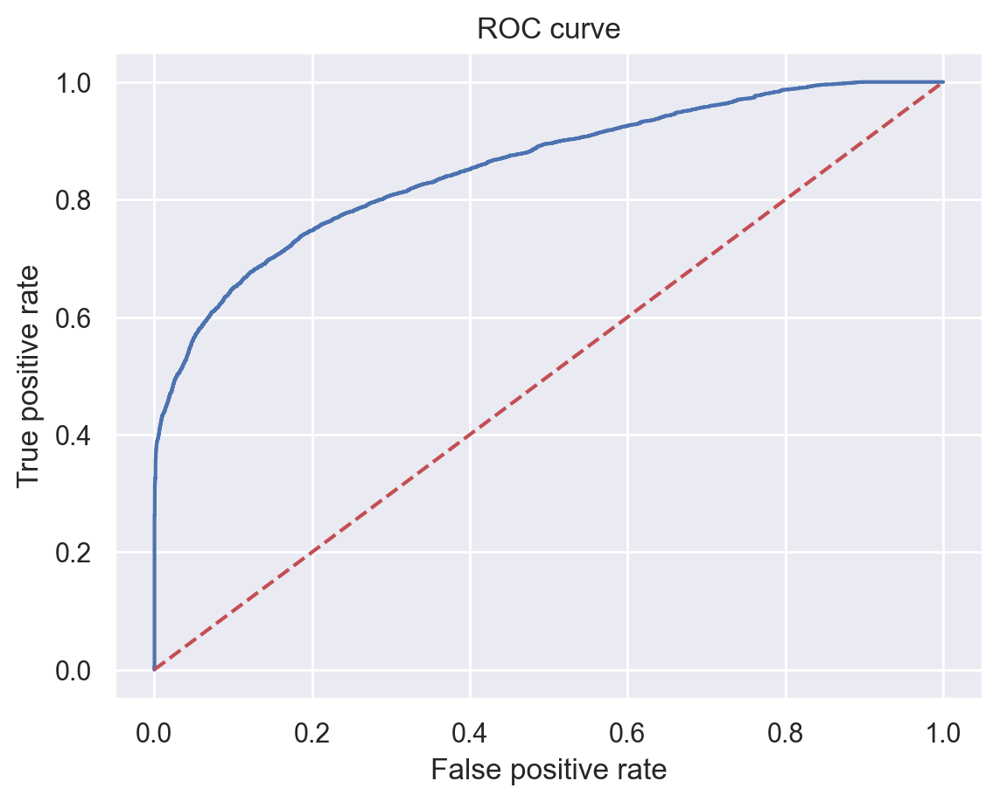

In [200]:
lr = LogisticRegression(max_iter=1000)
train_report(lr, 
             name='Logistic Regression',
             X_train=X_ohelog_train1_scaled,
             y_train=y_ohelog_train1,
             X_test=X_ohelog_val_scaled,
             y_test=y_ohelog_val
            )

In [530]:
lr_grid = pd.DataFrame(columns=['C', 'penalty', 'class_weight', 'preprocessing', 'roc_auc'])

parameters_lr = {
    'C': [0.1, 0.3, 0.5, 0.7, 1],
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],
    'class_weight': [None, 'balanced'],
    'max_iter': [1000]
}

lr_grid = grid_search_val(
    LogisticRegression(), 
    parameters_lr,
    scoring='roc_auc', 
    cv=ps, 
    datasets=datasets
)

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarnin

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://s

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyon

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increa

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://s

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increa

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increa

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFai

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increa

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,C,penalty,class_weight,max_iter,preprocessing,roc_auc
0,0.1,none,None,1000,OHE + log + scale,0.854436
2,0.1,none,None,1000,OHE + no log + scale,0.854436


In [531]:
lr_grid[lr_grid['roc_auc'] == lr_grid['roc_auc'].max()]

,C,penalty,class_weight,max_iter,preprocessing,roc_auc
0,0.1,none,None,1000,OHE + log + scale,0.854436
2,0.1,none,None,1000,OHE + no log + scale,0.854436


Train accuracy of Logistic Regression is : 0.8091542336522933

Accuracy Score of Logistic Regression is : 0.8073786626174005
Confusion Matrix : 
[[20738  1571]
 [ 5279  7974]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.80      0.93      0.86     22309
           1       0.84      0.60      0.70     13253

    accuracy                           0.81     35562
   macro avg       0.82      0.77      0.78     35562
weighted avg       0.81      0.81      0.80     35562

ROC-AUC score: 0.8517916489928605

F(1/2)-score: 0.7751832481091907


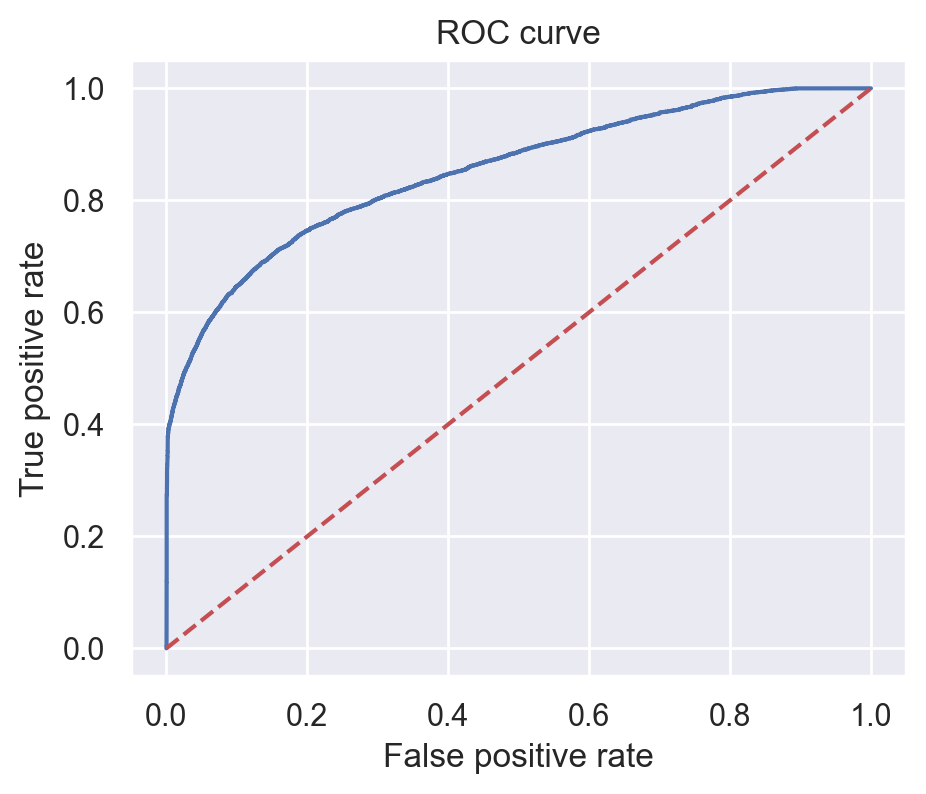

In [549]:
lr_best = LogisticRegression(max_iter=1000, penalty='none', class_weight=None)
train_report(lr_best, 
             name='Logistic Regression',
             X_train=X_ohe_train_scaled,
             y_train=y_ohe_train,
             X_test=X_ohe_test_scaled,
             y_test=y_ohe_test
            )

#### Дерево решений с подбором гиперпараметров

In [526]:
dtc = DecisionTreeClassifier()

parameters_dtc = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5, 10],
    'class_weight': ['balanced', None]
}

dtc_grid = grid_search_val(dtc, parameters_dtc)

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
24 fits failed out of a total of 72.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 937, in fit
    super().fit(
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
24 fits failed out of a total of 72.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 937, in fit
    super().fit(
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-

In [527]:
dtc_grid[dtc_grid['roc_auc'] == dtc_grid['roc_auc'].max()]

,criterion,min_samples_split,min_samples_leaf,class_weight,preprocessing,roc_auc
0,gini,5,10,None,OHE + log + scale,0.889812


Train accuracy of Decision Tree is : 0.8873074790908434

Accuracy Score of Decision Tree is : 0.8264158371295203
Confusion Matrix : 
[[19770  2539]
 [ 3634  9619]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.84      0.89      0.86     22309
           1       0.79      0.73      0.76     13253

    accuracy                           0.83     35562
   macro avg       0.82      0.81      0.81     35562
weighted avg       0.82      0.83      0.82     35562

ROC-AUC score: 0.8884452929036402

F(1/2)-score: 0.777167326492688


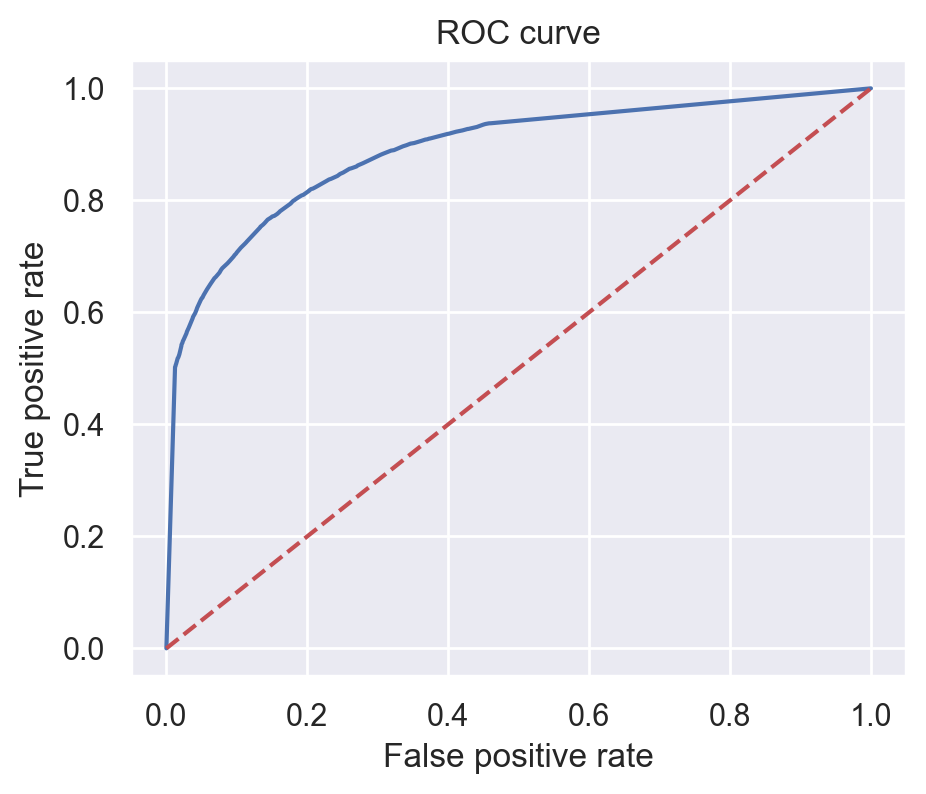

In [529]:
dtc = DecisionTreeClassifier(criterion='gini', min_samples_split=5, min_samples_leaf=10)
train_report(dtc, 
             'Decision Tree',
             X_train=X_ohelog_train_scaled,
             y_train=y_ohelog_train,
             X_test=X_ohelog_test_scaled,
             y_test=y_ohelog_test
            )

#### Случайный лес с подбором гиперпараметров

In [535]:
rfc = RandomForestClassifier()

parameters_rfc = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [2, 4, 6, None],
    'class_weight': ['balanced', 'balanced_subsample', None],
    'n_estimators': [100, 300]
}

rfc_grid = grid_search_val(rfc, parameters_rfc)

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
24 fits failed out of a total of 72.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 442, in fit
    trees = Parallel(
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
24 fits failed out of a total of 72.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 442, in fit
    trees = Parallel(
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3

/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
24 fits failed out of a total of 72.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 442, in fit
    trees = Parallel(
  File "/Users/katyona/Desktop/University/proga/iad/notebooks/lib/python3

In [536]:
rfc_grid[rfc_grid['roc_auc'] == rfc_grid['roc_auc'].max()]

,criterion,max_depth,class_weight,n_estimators,preprocessing,roc_auc
7,entropy,None,None,300,Lab + no log + no scale,0.933542


Train accuracy of Random Forest is : 0.9916845428908867

Accuracy Score of Random Forest is : 0.8674427759968506
Confusion Matrix : 
[[20746  1563]
 [ 3151 10102]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     22309
           1       0.87      0.76      0.81     13253

    accuracy                           0.87     35562
   macro avg       0.87      0.85      0.85     35562
weighted avg       0.87      0.87      0.87     35562

ROC-AUC score: 0.9337273828142814

F(1/2)-score: 0.8430557641914108


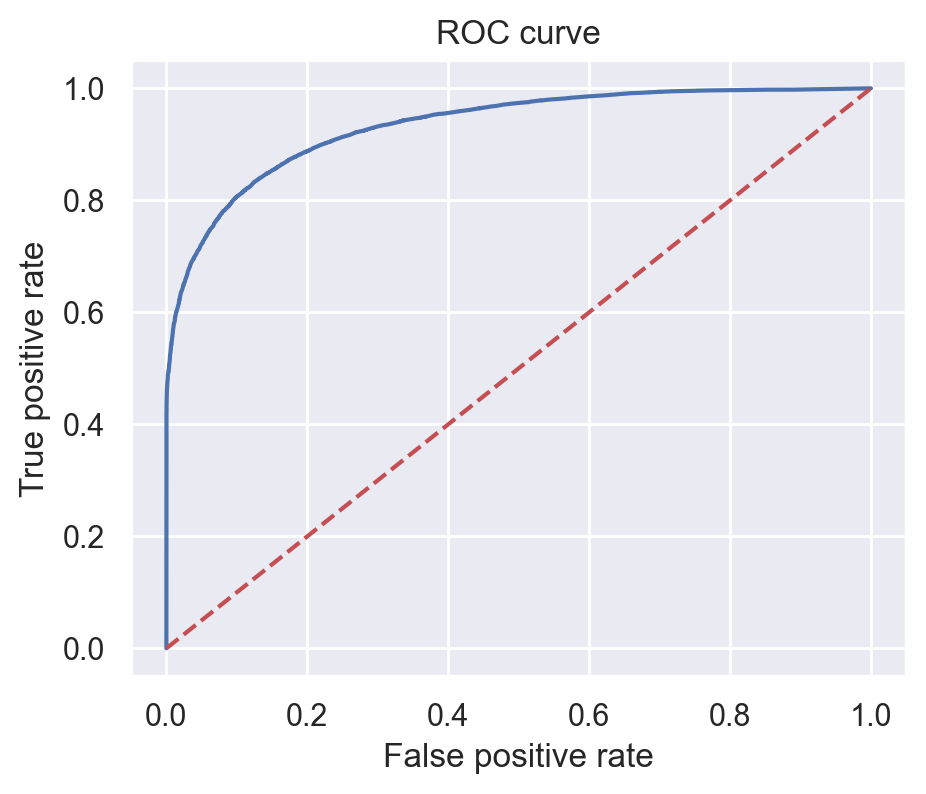

In [551]:
rfc = RandomForestClassifier(criterion='entropy', 
                             n_estimators=300)
train_report(rfc, 
             'Random Forest',
             X_train=X_lablog_train,
             y_train=y_lablog_train,
             X_test=X_lablog_test,
             y_test=y_lablog_test
            )

In [552]:
pickle.dump(rfc, open('cancellation_prediction.sav', 'wb'))

Поскольку дерево решений - одна из двух лучших моделей для предсказания отмены, посмотрим на зависимость качества от порога

In [539]:
probas = rfc.predict_proba(X_lablog_val)[:, 1]

for thresh in np.arange(0.05, 1, 0.05):
    preds = (probas >= thresh).astype(bool)
    acc = accuracy_score(y_ohe_val, preds)
    fbeta = fbeta_score(y_ohe_val, preds, beta=1/2)
    
    print(f'threshold = {np.round(thresh, 2)}')
    print(f'accuracy = {np.round(acc, 2)}, F(1/2)-score = {np.round(fbeta, 2)}\n')

threshold = 0.05
accuracy = 0.6, F(1/2)-score = 0.54

threshold = 0.1
accuracy = 0.69, F(1/2)-score = 0.6

threshold = 0.15
accuracy = 0.76, F(1/2)-score = 0.66

threshold = 0.2
accuracy = 0.8, F(1/2)-score = 0.7

threshold = 0.25
accuracy = 0.83, F(1/2)-score = 0.74

threshold = 0.3
accuracy = 0.84, F(1/2)-score = 0.77

threshold = 0.35
accuracy = 0.86, F(1/2)-score = 0.8

threshold = 0.4
accuracy = 0.86, F(1/2)-score = 0.82

threshold = 0.45
accuracy = 0.87, F(1/2)-score = 0.83

threshold = 0.5
accuracy = 0.87, F(1/2)-score = 0.85

threshold = 0.55
accuracy = 0.86, F(1/2)-score = 0.85

threshold = 0.6
accuracy = 0.86, F(1/2)-score = 0.86

threshold = 0.65
accuracy = 0.86, F(1/2)-score = 0.86

threshold = 0.7
accuracy = 0.85, F(1/2)-score = 0.86

threshold = 0.75
accuracy = 0.84, F(1/2)-score = 0.85

threshold = 0.8
accuracy = 0.83, F(1/2)-score = 0.85

threshold = 0.85
accuracy = 0.82, F(1/2)-score = 0.83

threshold = 0.9
accuracy = 0.8, F(1/2)-score = 0.82

threshold = 0.95
accuracy

#### Градиентный бустинг с подбором гиперпараметров

In [546]:
parameters_xgb = {
    'booster': ['gbtree', 'dart'],
    'learning_rate': [0.01, 0.05, 0.08, 0.1, 0.3, 0.5],
    'n_estimators': [100, 400, 1000],
    'objective': ['binary:logistic']
}

xgb_grid = grid_search_val(
    XGBClassifier(), 
    parameters_xgb
)

KeyboardInterrupt: 

In [ ]:
xgb_grid[xgb_grid['roc_auc'] == xgb_grid['roc_auc'].max()]

Train accuracy of XGB is : 0.9519752223480923

Accuracy Score of XGB is : 0.8561948146898375
Confusion Matrix : 
[[20244  2065]
 [ 3049 10204]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.91      0.89     22309
           1       0.83      0.77      0.80     13253

    accuracy                           0.86     35562
   macro avg       0.85      0.84      0.84     35562
weighted avg       0.86      0.86      0.85     35562

ROC-AUC score: 0.9211731525373722

F(1/2)-score: 0.8185595790081664


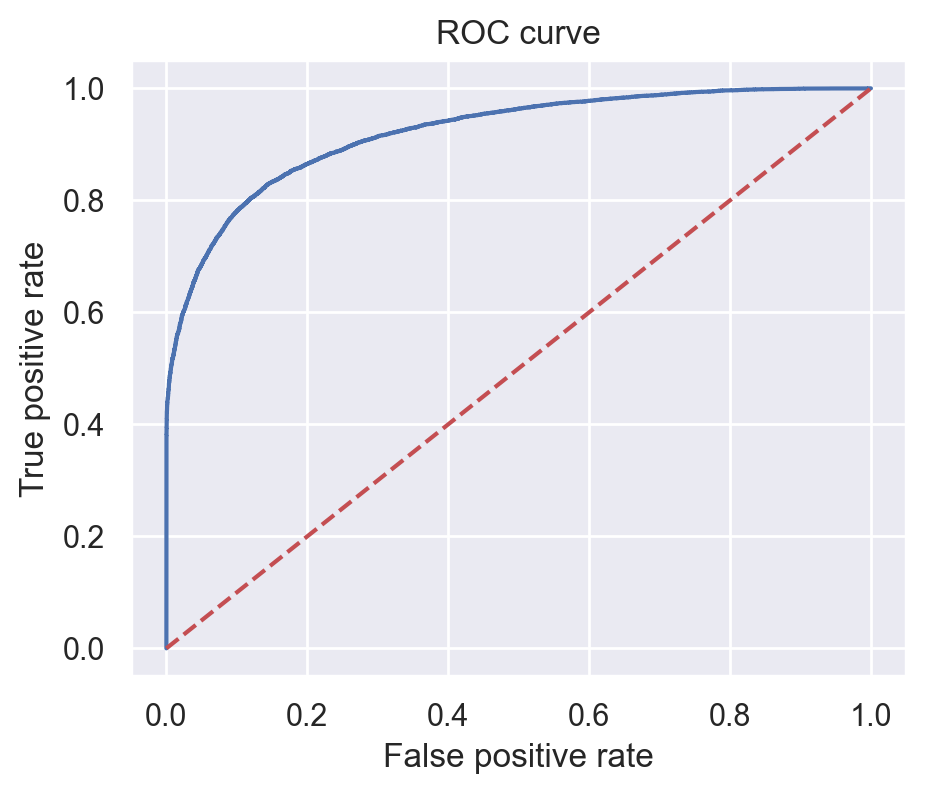

In [548]:
xgb = XGBClassifier(booster='gbtree', 
                    learning_rate=0.5, 
                    max_depth=6, 
                    n_estimators=500,
                    objective='binary:logistic'
                   )
train_report(xgb,
             'XGB',
             X_train=X_ohelog_train_scaled,
             y_train=y_ohelog_train,
             X_test=X_ohelog_test_scaled,
             y_test=y_ohelog_test
            )

Train accuracy of XGB is : 0.9150673375312585

Accuracy Score of XGB is : 0.8533984092552422
Confusion Matrix : 
[[9552  859]
 [1574 4611]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.92      0.89     10411
           1       0.84      0.75      0.79      6185

    accuracy                           0.85     16596
   macro avg       0.85      0.83      0.84     16596
weighted avg       0.85      0.85      0.85     16596

ROC-AUC score: 0.9208815267291988

F(1/2)-score: 0.8214858364510957


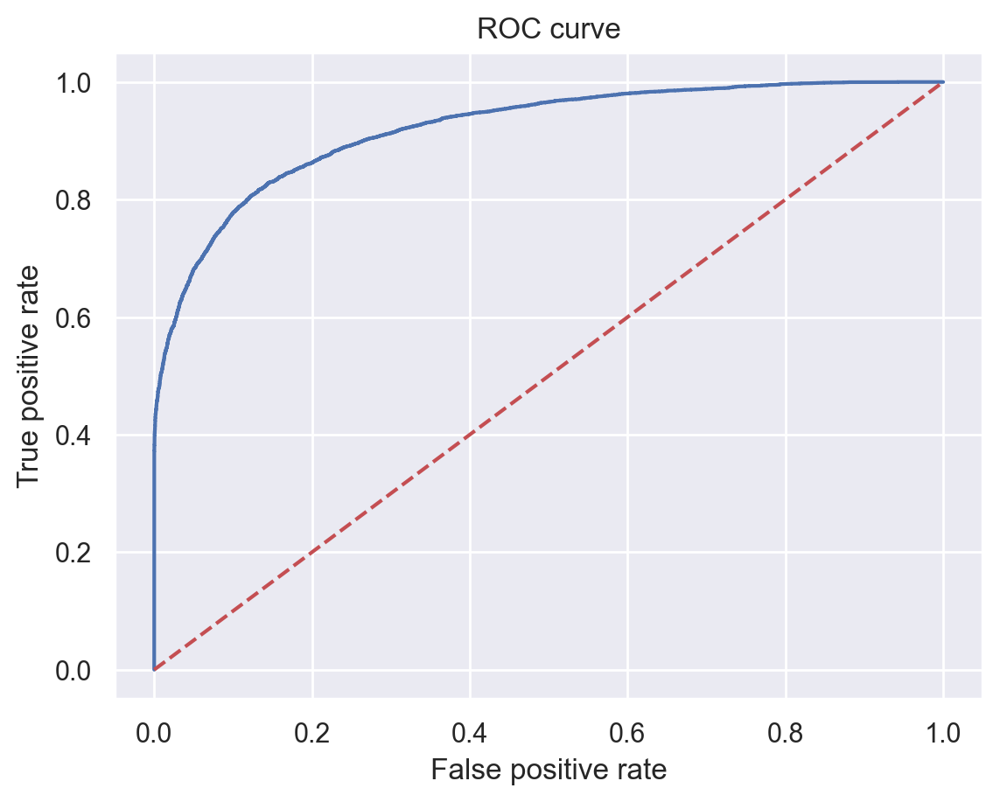

In [304]:
xgb = XGBClassifier(booster='gbtree', 
                    learning_rate=0.5, 
                    max_depth=6, 
                    n_estimators=200,
                    objective='reg:logistic'
                   )
train_report(xgb,
             'XGB',
             X_train=X_ohelog_train1_scaled,
             y_train=y_ohelog_train1,
             X_test=X_ohelog_val_scaled,
             y_test=y_ohelog_val
            )

In [ ]:
probas = xgb.predict_proba(X_ohelog_val_scaled)[:, 1]

for thresh in np.arange(0.05, 1, 0.05):
    preds = (probas >= thresh).astype(bool)
    acc = accuracy_score(y_ohelog_val, preds)
    fbeta = fbeta_score(y_ohelog_val, preds, beta=1/2)
    
    print(f'threshold = {np.round(thresh, 2)}')
    print(f'accuracy = {np.round(acc, 2)}, F(1/2)-score = {np.round(fbeta, 2)}\n')

Accuracy Score of XGB is : 0.8374950790169282
Confusion Matrix : 
[[20835  1474]
 [ 4305  8948]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.83      0.93      0.88     22309
           1       0.86      0.68      0.76     13253

    accuracy                           0.84     35562
   macro avg       0.84      0.80      0.82     35562
weighted avg       0.84      0.84      0.83     35562

ROC-AUC score: 0.9071634843014916

F(1/2)-score: 0.8143280974135891


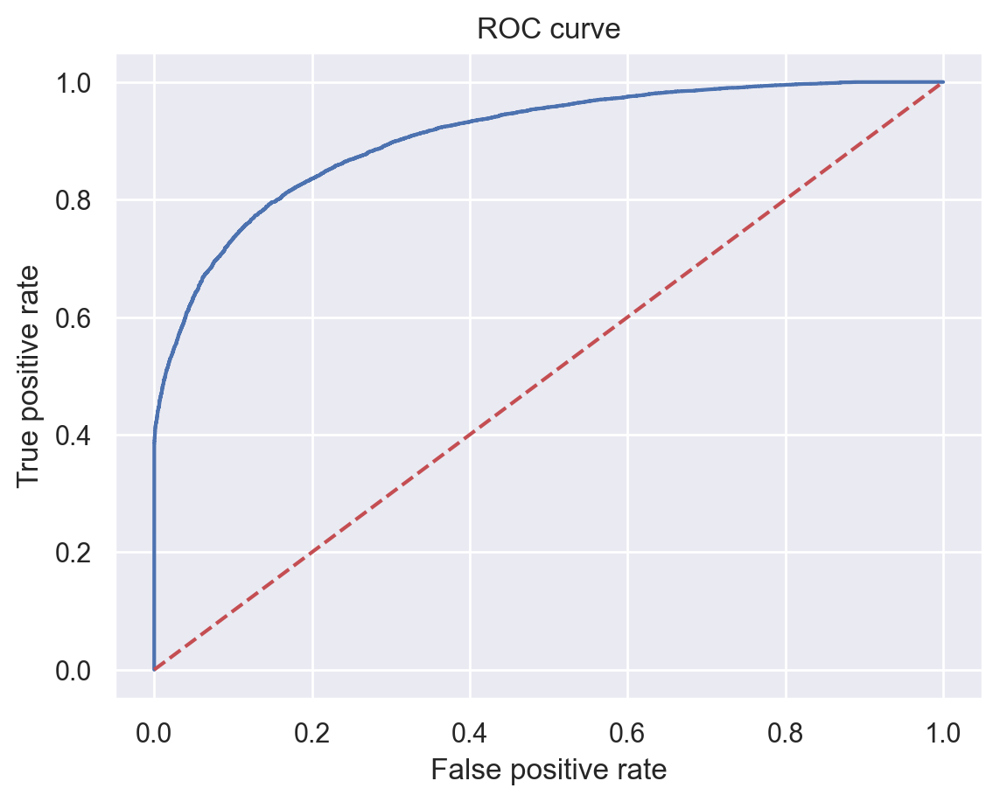

In [16]:
xgb = XGBClassifier(booster='gbtree', 
                    learning_rate=0.1, 
                    max_depth=5, 
                    n_estimators=180)
train_report(xgb, 'XGB')

Accuracy Score of CatBoost is : 0.8441032562847984
Confusion Matrix : 
[[20572  1737]
 [ 3807  9446]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.84      0.92      0.88     22309
           1       0.84      0.71      0.77     13253

    accuracy                           0.84     35562
   macro avg       0.84      0.82      0.83     35562
weighted avg       0.84      0.84      0.84     35562

ROC-AUC score: 0.9132965164378006

F(1/2)-score: 0.8145209968095196


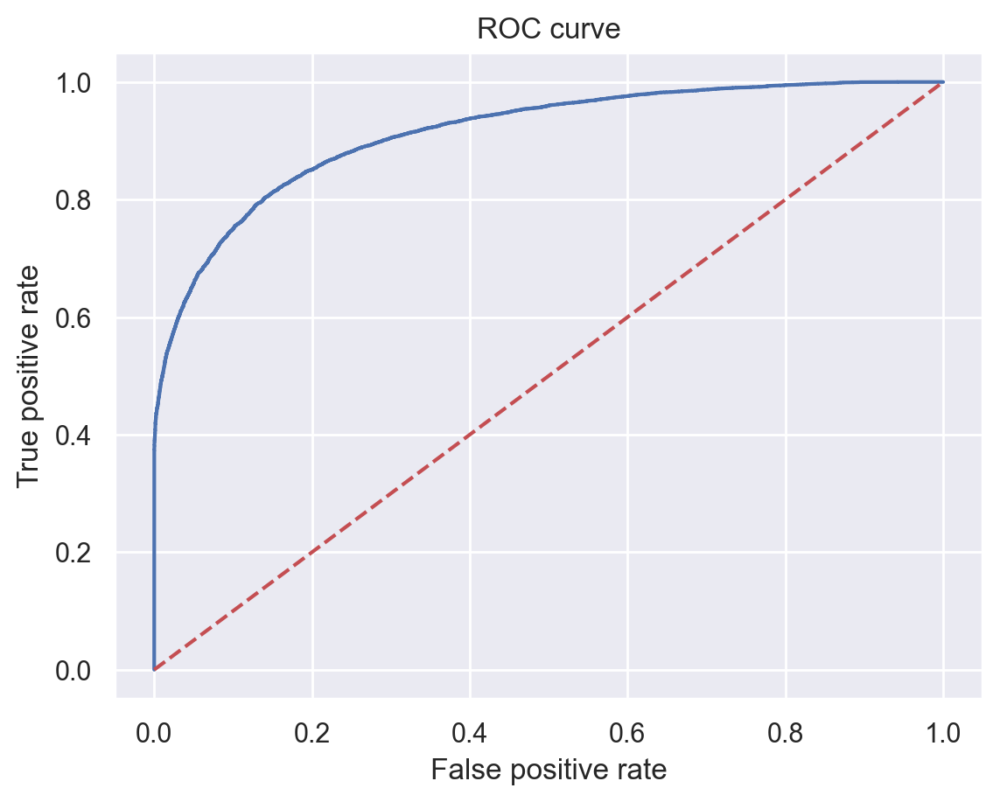

In [17]:
cat = CatBoostClassifier(iterations=100, silent=True)
train_report(cat, 'CatBoost')

Accuracy Score of Extra Tree Classifier is : 0.8663179798661492
Confusion Matrix : 
[[20623  1686]
 [ 3068 10185]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.92      0.90     22309
           1       0.86      0.77      0.81     13253

    accuracy                           0.87     35562
   macro avg       0.86      0.85      0.85     35562
weighted avg       0.87      0.87      0.86     35562

ROC-AUC score: 0.9295010247490153

F(1/2)-score: 0.8384510265571233


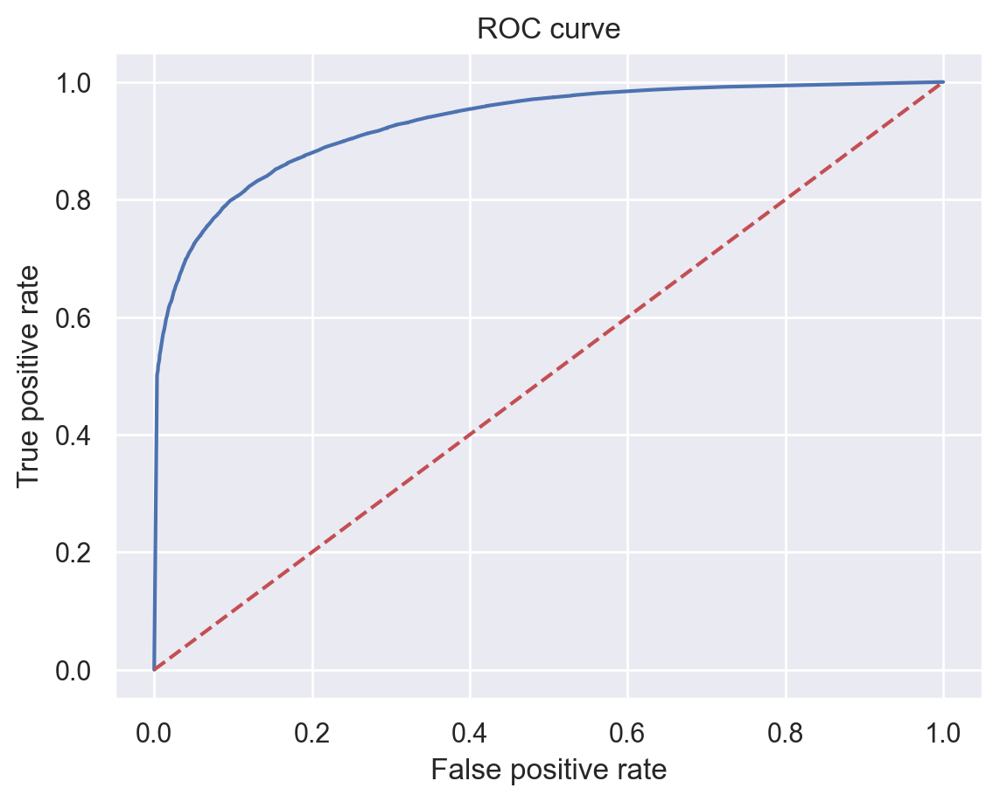

In [18]:
extra = ExtraTreesClassifier()
train_report(extra, 'Extra Tree Classifier')

In [22]:
classifiers = [('Gradient Boosting Classifier', gb), 
               ('Cat Boost Classifier', cat), 
               ('XGboost', xgb),  
               ('Decision Tree', dtc),
               ('Extra Tree', extra), 
               ('Random Forest', rfc), 
               ('Ada Boost', ada), 
               ('Logistic', lr),
               ('KNN', knn)]
vc = VotingClassifier(estimators=classifiers, voting='soft')
# vc.fit(X_train, y_train)

In [ ]:
train_report(vc, 'Voting Classifier')

In [ ]:
choose_threshold(vc)

## Oversampling

Вероятно, низкие показатели полноты связаны с дисбалансом классов (реализованных бронирований почти в 2 раза больше, чем отмененных). Попробуем добрать количество отмененных бронирований с помощью оверсемплинга

In [277]:
def choose_threshold(model, X_test, y_test, thr_range=[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]):
    probas = model.predict_proba(X_test)[:, 1]
    
    for thresh in thr_range:
        preds = (probas >= thresh).astype(bool)
        acc = accuracy_score(y_test, preds)
        fbeta = fbeta_score(y_test, preds, beta=1/2)

        print(f'threshold = {np.round(thresh, 2)}')
        print(f'accuracy = {np.round(acc, 2)}, F(1/2)-score = {np.round(fbeta, 2)}\n')

In [266]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=1000)
x_, y_ = smote.fit_resample(X_ohe_train1_scaled, y_ohe_train1)

print(x_[y_==0].shape)
print(x_[y_==1].shape)

(41644, 58)
(41644, 58)


Train accuracy of Logistic Regression (no oversampling) is : 0.8090898135036606

Accuracy Score of Logistic Regression (no oversampling) is : 0.8075439865027717
Confusion Matrix : 
[[9697  714]
 [2480 3705]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.80      0.93      0.86     10411
           1       0.84      0.60      0.70      6185

    accuracy                           0.81     16596
   macro avg       0.82      0.77      0.78     16596
weighted avg       0.81      0.81      0.80     16596

ROC-AUC score: 0.8541994829018837

F(1/2)-score: 0.7763714848497547


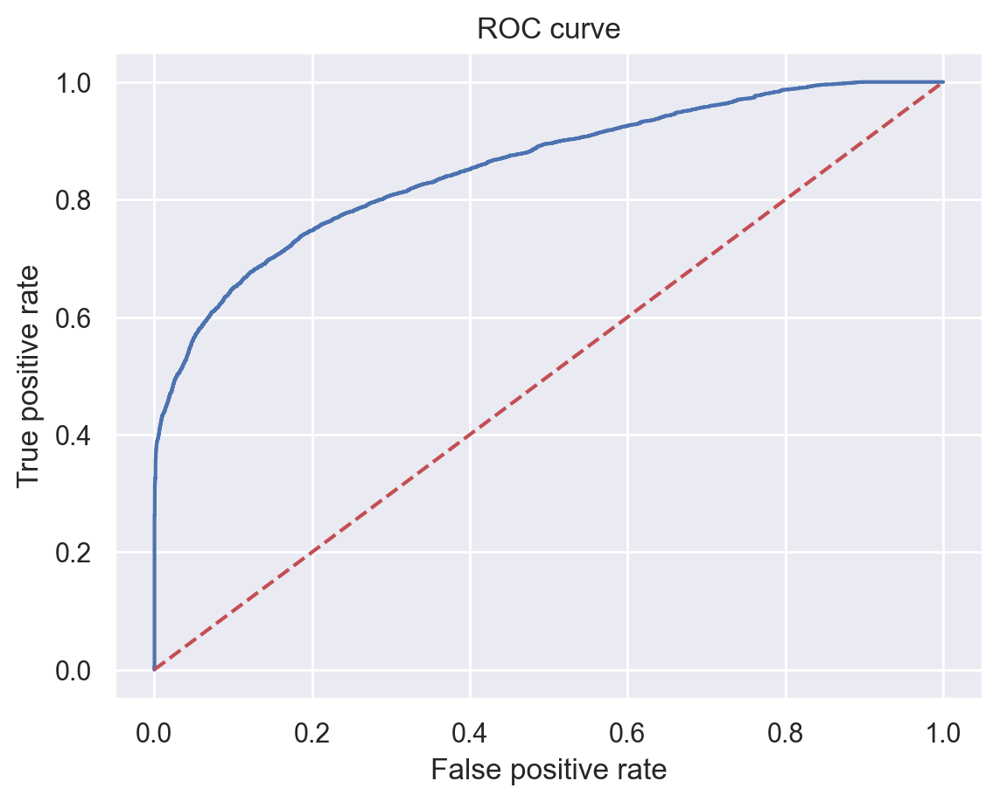

In [269]:
lr = LogisticRegression(max_iter=1000)
train_report(lr, 
             'Logistic Regression (no oversampling)', 
             X_train = X_ohe_train1_scaled,
             y_train = y_ohe_train1,
             X_test = X_ohe_val_scaled,
             y_test = y_ohe_val
            )

In [278]:
choose_threshold(lr, 
                 X_test = X_ohe_val_scaled,
                 y_test = y_ohe_val,
                 thr_range = np.arange(0.05, 1, 0.05)
                )

threshold = 0.05
accuracy = 0.46, F(1/2)-score = 0.46

threshold = 0.1
accuracy = 0.52, F(1/2)-score = 0.49

threshold = 0.15
accuracy = 0.59, F(1/2)-score = 0.52

threshold = 0.2
accuracy = 0.66, F(1/2)-score = 0.57

threshold = 0.25
accuracy = 0.71, F(1/2)-score = 0.61

threshold = 0.3
accuracy = 0.75, F(1/2)-score = 0.66

threshold = 0.35
accuracy = 0.78, F(1/2)-score = 0.7

threshold = 0.4
accuracy = 0.79, F(1/2)-score = 0.73

threshold = 0.45
accuracy = 0.81, F(1/2)-score = 0.76

threshold = 0.5
accuracy = 0.81, F(1/2)-score = 0.78

threshold = 0.55
accuracy = 0.8, F(1/2)-score = 0.78

threshold = 0.6
accuracy = 0.79, F(1/2)-score = 0.78

threshold = 0.65
accuracy = 0.78, F(1/2)-score = 0.77

threshold = 0.7
accuracy = 0.78, F(1/2)-score = 0.76

threshold = 0.75
accuracy = 0.77, F(1/2)-score = 0.75

threshold = 0.8
accuracy = 0.76, F(1/2)-score = 0.74

threshold = 0.85
accuracy = 0.76, F(1/2)-score = 0.73

threshold = 0.9
accuracy = 0.75, F(1/2)-score = 0.72

threshold = 0.95
accu

Train accuracy of Logistic Regression (oversampling) is : 0.776426375948516

Accuracy Score of Logistic Regression (oversampling) is : 0.7886840202458424
Confusion Matrix : 
[[8609 1802]
 [1705 4480]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.83      0.83      0.83     10411
           1       0.71      0.72      0.72      6185

    accuracy                           0.79     16596
   macro avg       0.77      0.78      0.77     16596
weighted avg       0.79      0.79      0.79     16596

ROC-AUC score: 0.8545326452254537

F(1/2)-score: 0.7153578385973878


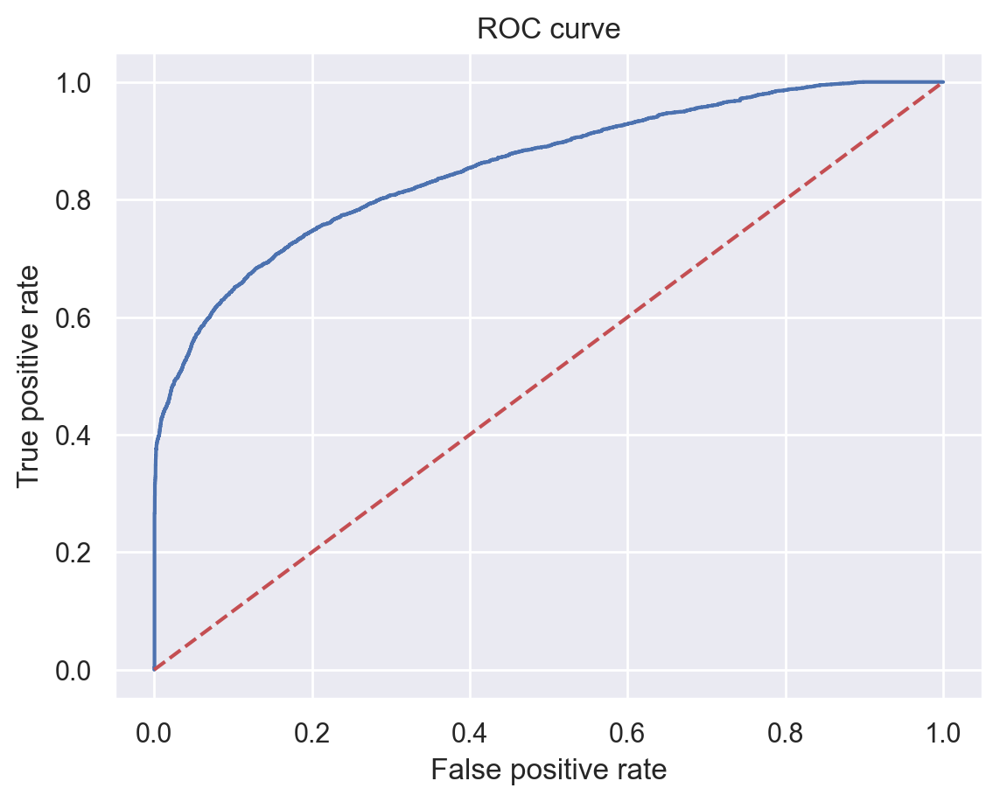

In [279]:
lr1 = LogisticRegression(max_iter=1000)
train_report(lr1, 'Logistic Regression (oversampling)', X_train=x_, y_train=y_)

In [281]:
choose_threshold(lr1, 
                 X_test = X_ohe_val_scaled,
                 y_test = y_ohe_val,
                 thr_range = np.arange(0.05, 1, 0.05)
                )

threshold = 0.05
accuracy = 0.45, F(1/2)-score = 0.46

threshold = 0.1
accuracy = 0.48, F(1/2)-score = 0.47

threshold = 0.15
accuracy = 0.51, F(1/2)-score = 0.49

threshold = 0.2
accuracy = 0.56, F(1/2)-score = 0.51

threshold = 0.25
accuracy = 0.61, F(1/2)-score = 0.54

threshold = 0.3
accuracy = 0.66, F(1/2)-score = 0.58

threshold = 0.35
accuracy = 0.7, F(1/2)-score = 0.61

threshold = 0.4
accuracy = 0.74, F(1/2)-score = 0.64

threshold = 0.45
accuracy = 0.77, F(1/2)-score = 0.68

threshold = 0.5
accuracy = 0.79, F(1/2)-score = 0.72

threshold = 0.55
accuracy = 0.8, F(1/2)-score = 0.74

threshold = 0.6
accuracy = 0.81, F(1/2)-score = 0.77

threshold = 0.65
accuracy = 0.81, F(1/2)-score = 0.78

threshold = 0.7
accuracy = 0.8, F(1/2)-score = 0.78

threshold = 0.75
accuracy = 0.79, F(1/2)-score = 0.77

threshold = 0.8
accuracy = 0.77, F(1/2)-score = 0.76

threshold = 0.85
accuracy = 0.77, F(1/2)-score = 0.75

threshold = 0.9
accuracy = 0.76, F(1/2)-score = 0.73

threshold = 0.95
accur

In [31]:
cat = CatBoostClassifier(iterations=300, silent=True)
train_report(cat, 'CatBoost (oversmapling)', X_train=x_, y_train=y_)

Accuracy Score of CatBoost (oversmapling) is : 0.846352848546201
Confusion Matrix : 
[[20248  2061]
 [ 3403  9850]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     22309
           1       0.83      0.74      0.78     13253

    accuracy                           0.85     35562
   macro avg       0.84      0.83      0.83     35562
weighted avg       0.85      0.85      0.84     35562



In [32]:
choose_threshold(cat)

threshold = 0.3, accuracy = 0.8
threshold = 0.4, accuracy = 0.83
threshold = 0.5, accuracy = 0.85
threshold = 0.6, accuracy = 0.84
threshold = 0.7, accuracy = 0.83
threshold = 0.8, accuracy = 0.81
threshold = 0.9, accuracy = 0.78


Train accuracy of Random Forest (oversampling) is : 0.9929881855729517

Accuracy Score of Random Forest (oversampling) is : 0.8655097613882863
Confusion Matrix : 
[[9596  815]
 [1417 4768]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.92      0.90     10411
           1       0.85      0.77      0.81      6185

    accuracy                           0.87     16596
   macro avg       0.86      0.85      0.85     16596
weighted avg       0.86      0.87      0.86     16596

ROC-AUC score: 0.9308531870440188

F(1/2)-score: 0.8359925658379211


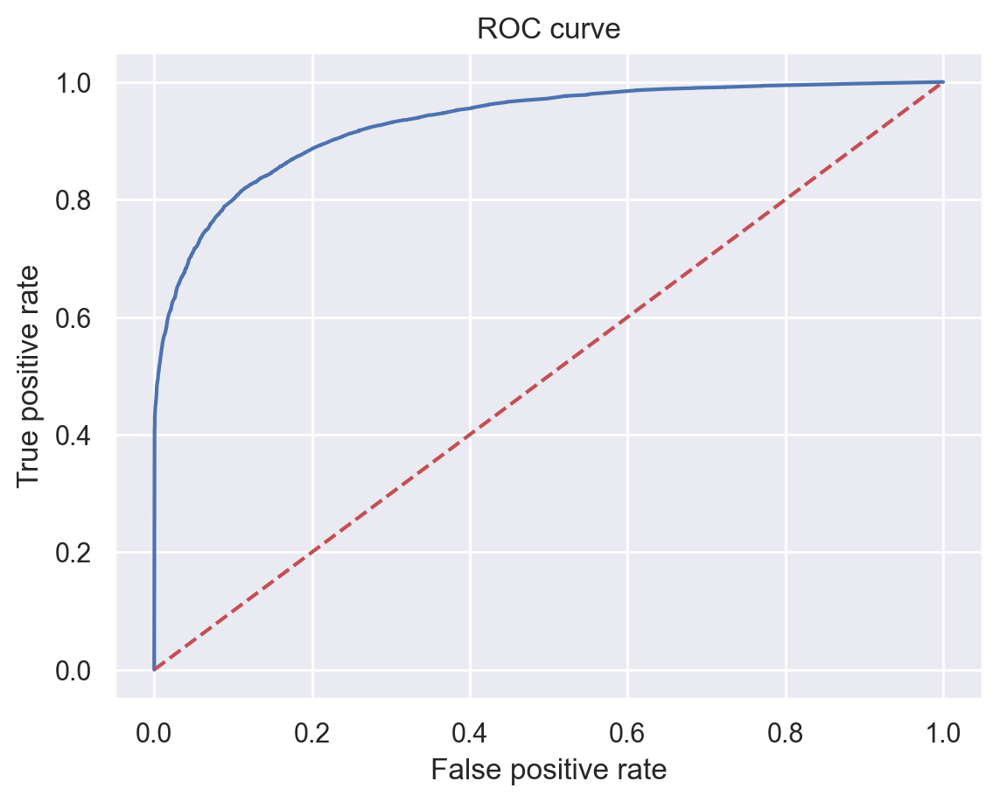

In [282]:
rfc_oversmaple = RandomForestClassifier()
train_report(rfc_oversmaple, 'Random Forest (oversampling)', X_train=x_, y_train=y_)

In [283]:
choose_threshold(rfc_oversmaple, 
                 X_test = X_ohe_val_scaled,
                 y_test = y_ohe_val,
                 thr_range = np.arange(0.05, 1, 0.05)
                )

threshold = 0.05
accuracy = 0.57, F(1/2)-score = 0.52

threshold = 0.1
accuracy = 0.67, F(1/2)-score = 0.58

threshold = 0.15
accuracy = 0.74, F(1/2)-score = 0.64

threshold = 0.2
accuracy = 0.78, F(1/2)-score = 0.68

threshold = 0.25
accuracy = 0.81, F(1/2)-score = 0.72

threshold = 0.3
accuracy = 0.83, F(1/2)-score = 0.75

threshold = 0.35
accuracy = 0.85, F(1/2)-score = 0.78

threshold = 0.4
accuracy = 0.86, F(1/2)-score = 0.8

threshold = 0.45
accuracy = 0.86, F(1/2)-score = 0.82

threshold = 0.5
accuracy = 0.86, F(1/2)-score = 0.83

threshold = 0.55
accuracy = 0.86, F(1/2)-score = 0.84

threshold = 0.6
accuracy = 0.86, F(1/2)-score = 0.85

threshold = 0.65
accuracy = 0.86, F(1/2)-score = 0.85

threshold = 0.7
accuracy = 0.85, F(1/2)-score = 0.86

threshold = 0.75
accuracy = 0.84, F(1/2)-score = 0.85

threshold = 0.8
accuracy = 0.83, F(1/2)-score = 0.85

threshold = 0.85
accuracy = 0.82, F(1/2)-score = 0.84

threshold = 0.9
accuracy = 0.81, F(1/2)-score = 0.82

threshold = 0.95
acc

In [142]:
cat = CatBoostClassifier(iterations=300, silent=True)
cat.fit(x_, y_)

y_pred_cat = cat.predict(X_test)

acc_cat = accuracy_score(y_test, y_pred_cat)
conf = confusion_matrix(y_test, y_pred_cat)
clf_report = classification_report(y_test, y_pred_cat)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_cat}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.8475338844834374
Confusion Matrix : 
[[20218  2091]
 [ 3331  9922]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     22309
           1       0.83      0.75      0.79     13253

    accuracy                           0.85     35562
   macro avg       0.84      0.83      0.83     35562
weighted avg       0.85      0.85      0.85     35562



In [145]:
lr = LogisticRegression(max_iter=1000)
lr.fit(x_, y_)

y_pred_lr = lr.predict(X_test)

acc_lr = accuracy_score(y_test, y_pred_lr)
conf = confusion_matrix(y_test, y_pred_lr)
clf_report = classification_report(y_test, y_pred_lr)

print(f"Accuracy Score of Logistic Regression is : {acc_lr}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Logistic Regression is : 0.7691637140768236
Confusion Matrix : 
[[17914  4395]
 [ 3814  9439]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.82      0.80      0.81     22309
           1       0.68      0.71      0.70     13253

    accuracy                           0.77     35562
   macro avg       0.75      0.76      0.76     35562
weighted avg       0.77      0.77      0.77     35562



Train accuracy of Extra Tree (oversampling) is : 0.9930001921045049

Accuracy Score of Extra Tree (oversampling) is : 0.8561099060014461
Confusion Matrix : 
[[9467  944]
 [1444 4741]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.91      0.89     10411
           1       0.83      0.77      0.80      6185

    accuracy                           0.86     16596
   macro avg       0.85      0.84      0.84     16596
weighted avg       0.86      0.86      0.85     16596

ROC-AUC score: 0.9234385277620127

F(1/2)-score: 0.8195332757130509


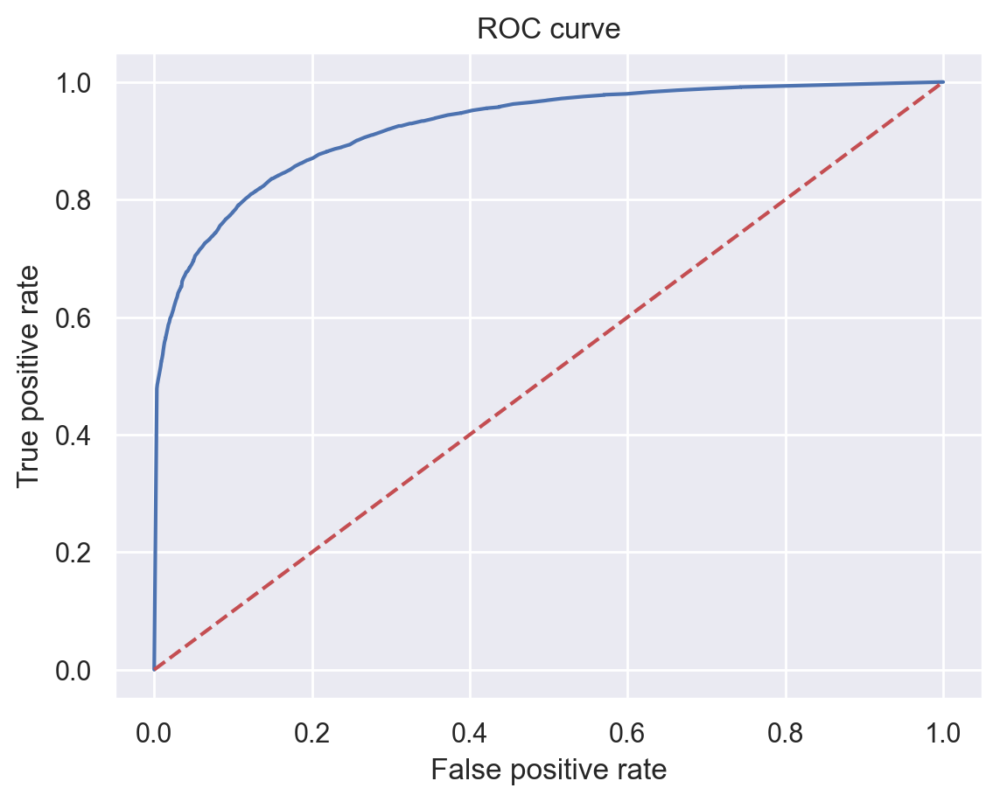

In [284]:
etc_oversample = ExtraTreesClassifier()
train_report(etc_oversample, 'Extra Tree (oversampling)', X_train=x_, y_train=y_)

In [285]:
choose_threshold(etc_oversample, 
                 X_test = X_ohe_val_scaled,
                 y_test = y_ohe_val,
                 thr_range = np.arange(0.05, 1, 0.05)
                )

threshold = 0.05
accuracy = 0.62, F(1/2)-score = 0.55

threshold = 0.1
accuracy = 0.69, F(1/2)-score = 0.6

threshold = 0.15
accuracy = 0.75, F(1/2)-score = 0.65

threshold = 0.2
accuracy = 0.78, F(1/2)-score = 0.68

threshold = 0.25
accuracy = 0.8, F(1/2)-score = 0.71

threshold = 0.3
accuracy = 0.82, F(1/2)-score = 0.74

threshold = 0.35
accuracy = 0.84, F(1/2)-score = 0.77

threshold = 0.4
accuracy = 0.85, F(1/2)-score = 0.79

threshold = 0.45
accuracy = 0.85, F(1/2)-score = 0.8

threshold = 0.5
accuracy = 0.86, F(1/2)-score = 0.82

threshold = 0.55
accuracy = 0.86, F(1/2)-score = 0.83

threshold = 0.6
accuracy = 0.86, F(1/2)-score = 0.84

threshold = 0.65
accuracy = 0.85, F(1/2)-score = 0.85

threshold = 0.7
accuracy = 0.85, F(1/2)-score = 0.85

threshold = 0.75
accuracy = 0.84, F(1/2)-score = 0.85

threshold = 0.8
accuracy = 0.84, F(1/2)-score = 0.85

threshold = 0.85
accuracy = 0.83, F(1/2)-score = 0.84

threshold = 0.9
accuracy = 0.82, F(1/2)-score = 0.83

threshold = 0.95
accur

In [ ]:
y_proba = svm.predict_proba(X_test)[:,1]
for thresh in [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
    y_pred = (y_proba >= thresh).astype(bool)
    acc_svm = accuracy_score(y_test, y_pred)
    
    print(f'threshold = {thresh}, accuracy = {np.round(acc_svm, 2)}')

Лучшие результаты показали модели `ExtraTreesClassifier` и `RandomForestClassifier`

In [ ]:
 print('yo')

# Загрузка и проверка лучшей модели

Чтобы перенести уже обученную модель, ее можно скачать на диск

In [293]:
filename = 'random_forest_model.sav'
pickle.dump(rfc, open(filename, 'wb'))

Train accuracy of Random Forest on full data is : 0.9916845428908867

Accuracy Score of Random Forest on full data is : 0.8653056633485181
Confusion Matrix : 
[[20753  1556]
 [ 3234 10019]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     22309
           1       0.87      0.76      0.81     13253

    accuracy                           0.87     35562
   macro avg       0.87      0.84      0.85     35562
weighted avg       0.87      0.87      0.86     35562

ROC-AUC score: 0.9319680801378938

F(1/2)-score: 0.8411834836196328


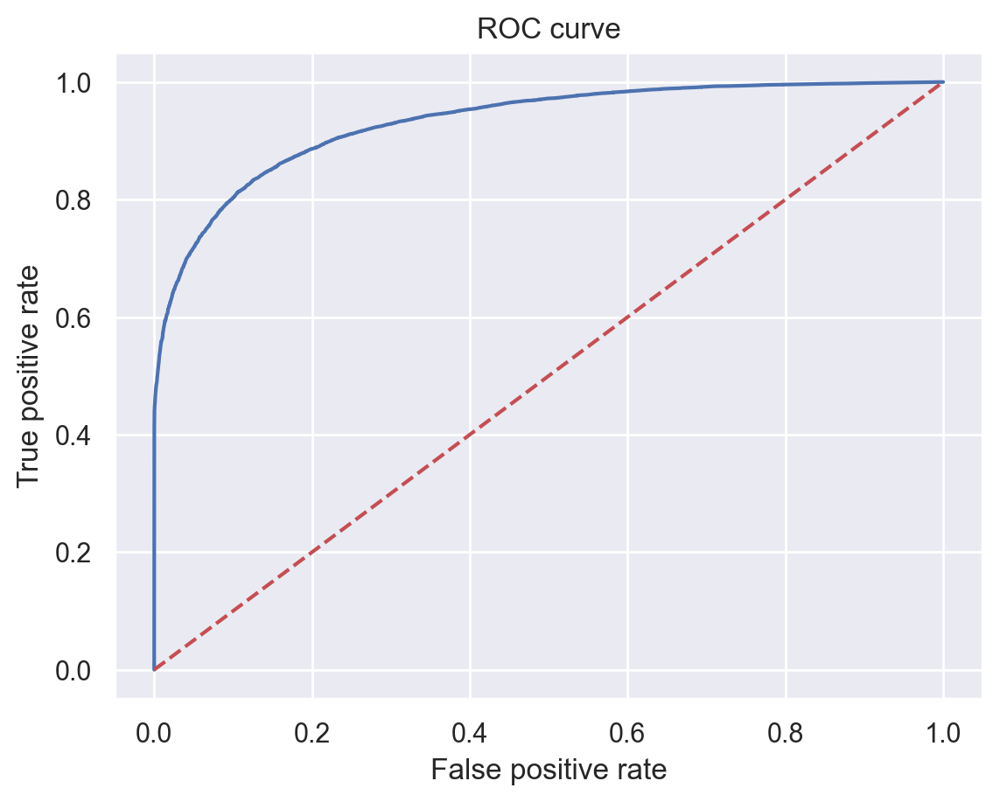

In [301]:
rfc_full = pickle.load(open('random_forest_model.sav', 'rb'))
train_report(rfc_full, 
             'Random Forest on full data',
             X_train=X_ohe_train_scaled,
             y_train=y_ohe_train,
             X_test=X_ohe_test_scaled,
             y_test=y_ohe_test
            )

In [302]:
predds = rfc_full.predict(X_ohe_test_scaled)
print(f'1: {accuracy_score(predds[y_ohe_test == 1], y_ohe_test[y_ohe_test == 1])}')
print(f'0: {accuracy_score(predds[y_ohe_test == 0], y_ohe_test[y_ohe_test == 0])}')

1: 0.7559797781634346
0: 0.9302523645165628
